In [1]:
import tensorflow as tf
import numpy as np

from utils import plot_images, print_progress, merge, add_variable_histogram_summaries
from glob import glob
from os import getcwd
from os.path import exists
from time import time
from scipy.misc import imresize

In [2]:
DIR_NB = getcwd()

In [3]:
class Classifier():
    def __init__(self):
        pass
    
    def label(self, filenames):
        labels = np.zeros(len(filenames), dtype=int)
        for i, filename in enumerate(filenames):
            if filename[:filename.find('.')] == 'dog':
                labels[i] = 1
                
        return self._one_hot(labels)
    
    def _one_hot(self, labels, length=None):
        if length == None:
            length = np.max(labels) + 1

        one_hot_labels = np.zeros((len(labels), length))
        one_hot_labels[range(len(labels)), labels] = 1
        
        return one_hot_labels

In [4]:
class Data():
    def __init__(self, path, classifier):
        self.path = path
        self.classifier = classifier
        self.filenames = {}
        self.num_examples = {}
        
        curr_dir = getcwd()
        for mode in ['train', 'test', 'valid']:
            %cd $path/$mode
            self.filenames[mode] = glob('*.jpg')
            self.num_examples[mode] = len(self.filenames[mode])
        %cd $curr_dir
        
    def next_batch(self, batch_size, batch=None, mode='train'):
        if batch is None:
            batch_idx = np.random.randint(0, self.num_examples[mode], batch_size)
        else:
            batch_idx = np.arange(batch*batch_size, min((batch + 1) * batch_size, self.num_examples[mode]))
            
        x_batch = []
        for batch_id in batch_idx:
            x_batch.append(imread(self.path + '/' + mode + '/' + self.filenames[mode][batch_id]))
        
        y_batch = self.classifier.label(np.array(self.filenames[mode])[batch_idx])
        
        return np.stack(x_batch) / 127.5 - 1, np.stack(y_batch)

In [5]:
use_sample = False
if use_sample:
    DIR_DATA = DIR_NB + '/Data/CatDog/sample'
else:
    DIR_DATA = DIR_NB + '/Data/CatDog'
    
data = Data(DIR_DATA, Classifier())
data.num_examples

/home/vaisakh/TensorFlow-Tutorials/Data/CatDog/train
/home/vaisakh/TensorFlow-Tutorials/Data/CatDog/test
/home/vaisakh/TensorFlow-Tutorials/Data/CatDog/valid
/home/vaisakh/TensorFlow-Tutorials


{'test': 12500, 'train': 20000, 'valid': 5000}

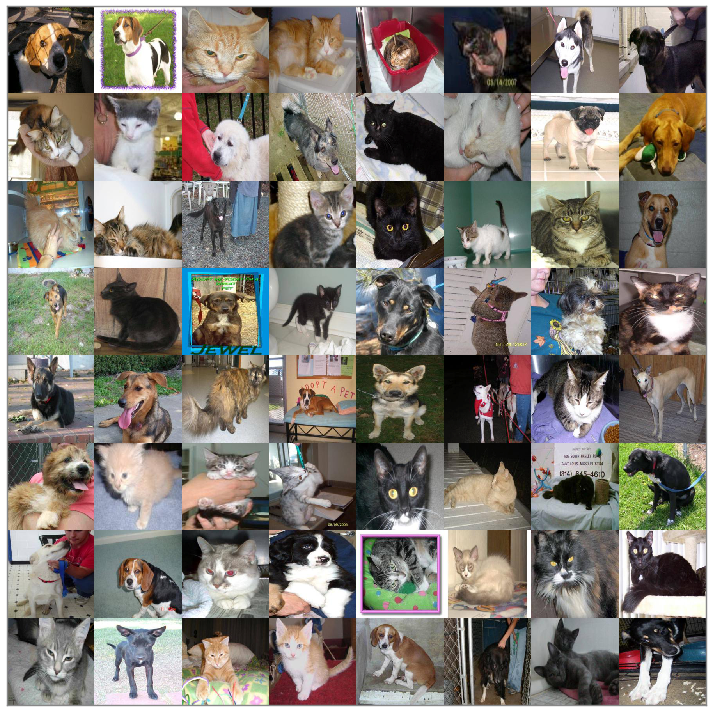

In [6]:
plot_images((merge(data.next_batch(64)[0]) + 1) / 2)

In [35]:
def classifier(x, training):
    conv1 = tf.layers.conv2d(x, 64, (3, 3), (2, 2), 'same', activation=tf.nn.relu, name='conv1')
    conv2 = tf.layers.conv2d(conv1, 128, (3, 3), (2, 2), 'same', activation=tf.nn.relu, name='conv2')
    conv3 = tf.layers.conv2d(conv2, 256, (3, 3), (2, 2), 'same', activation=tf.nn.relu, name='conv3')
    conv4 = tf.layers.conv2d(conv3, 512, (3, 3), (2, 2), 'same', activation=tf.nn.relu, name='conv4')
    conv5 = tf.layers.conv2d(conv4, 512, (3, 3), (2, 2), 'same', activation=tf.nn.relu, name='conv5')
    s = tf.reshape(conv5, (-1, 7 * 7 * 512))
    s = tf.contrib.layers.dropout(s, 0.3, is_training=training)
    s = tf.layers.dense(s, 1024)
    s = tf.layers.dense(s, 2)
    return s, [conv1, conv2, conv3, conv4, conv5]

In [36]:
tf.reset_default_graph()

with tf.name_scope('inputs'):
    x = tf.placeholder(tf.float32, (None, 224, 224, 3), 'x')
    y = tf.placeholder(tf.float32, (None, 2), 'y')
    training = tf.placeholder_with_default(True, [], 'training')
    
with tf.variable_scope('classifier'):
    scores, conv_activations = classifier(x, training)
    y_true = tf.nn.softmax(scores)

with tf.name_scope('optimizer'):
    loss = tf.reduce_mean(tf.nn.softmax_cross_entropy_with_logits(labels=y, logits=scores, name='cross_entropy'), name='mean')
    optimizer = tf.train.AdamOptimizer(learning_rate=1e-3).minimize(loss)
    
    img_grad_cat = tf.reduce_sum(tf.abs(tf.gradients(y_true[:, 0], x)[0]), 3)
    img_grad_dog = tf.reduce_sum(tf.abs(tf.gradients(y_true[:, 1], x)[0]), 3)

with tf.name_scope('metrics'):
    accuracy = tf.reduce_mean(tf.cast(tf.equal(tf.argmax(y_true, 1), tf.argmax(y, 1)), tf.float32))
    
tf.summary.scalar('accuracy', accuracy)
tf.summary.scalar('loss', loss)
add_variable_histogram_summaries()
summ = tf.summary.merge_all()

val_accuracy_summ = tf.summary.scalar('val_accuracy', accuracy)
val_loss_summ = tf.summary.scalar('val_loss', loss)

saver = tf.train.Saver()

In [30]:
NB_NAME = 'CatDog'
DIR_OUTPUT = DIR_NB + '/output/' + NB_NAME
DIR_WRITE = DIR_NB + '/checkpoints/' + NB_NAME

In [19]:
def write_validation_scores(sess, writer, global_step):
    x_batch, y_batch = data.next_batch(batch_size, mode='valid')
    cost, acc = sess.run([val_loss_summ, val_accuracy_summ], {x: x_batch, y: y_batch, training:False})
    
    writer.add_summary(cost, global_step)
    writer.add_summary(acc, global_step)

In [20]:
def restore_checkpoint(sess):
    if exists(DIR_WRITE + '/' +  NB_NAME + '.data-00000-of-00001'):
        saver.restore(sess, DIR_WRITE + '/' + NB_NAME)
    else:
        sess.run(tf.global_variables_initializer())
        
    if exists(DIR_WRITE + '/epochs_completed.npy'):
        return np.load(DIR_WRITE + '/epochs_completed.npy')
    else:
        return 0

In [21]:
batch_size = 32
writes_per_epoch = 10

batches_per_epoch = int(data.num_examples['train'] / batch_size)

def optimize(epochs=1):
    start_time = time()
    writer = tf.summary.FileWriter(DIR_WRITE, tf.get_default_graph())
    
    with tf.Session() as sess:
        start_epochs = restore_checkpoint(sess)
        for epoch in range(epochs):
            epoch_start_time = time()
            print('Epoch {} started'.format(start_epochs + epoch))
            for batch in range(batches_per_epoch):
                x_batch, y_batch = data.next_batch(batch_size)
                feed_dict_train = {x: x_batch, y: y_batch}
                sess.run(optimizer, feed_dict_train)
                
                if batch % int(batches_per_epoch / writes_per_epoch) == 0 or batch == batches_per_epoch-1:
                    writer.add_summary(sess.run(summ, feed_dict_train), global_step=(start_epochs+epoch)*batches_per_epoch + batch)
                    write_validation_scores(sess, writer, (start_epochs+epoch)*batches_per_epoch + batch)
                
                print_progress(batch, batches_per_epoch, epoch_start_time)
            saver.save(sess, DIR_WRITE + '/' + NB_NAME, write_meta_graph=False)
        
    print("Optimization done! Time taken: {}s".format(int(time()-start_time)))
    writer.close()
    np.save(DIR_WRITE + '/epochs_completed.npy', start_epochs + epochs)

In [38]:
optimize(7)

INFO:tensorflow:Restoring parameters from /home/vaisakh/TensorFlow-Tutorials/checkpoints/CatDog/CatDog
Epoch 3 started
Completed in 72s. Time - 71s, ETA - 0s			

Epoch 4 started
Completed in 72s. Time - 71s, ETA - 0s			

Epoch 5 started
Completed in 72s. Time - 71s, ETA - 0s			

Epoch 6 started
Completed in 72s. Time - 71s, ETA - 0s			

Epoch 7 started
Completed in 72s. Time - 71s, ETA - 0s			

Epoch 8 started
Completed in 72s. Time - 71s, ETA - 0s			

Epoch 9 started
Completed in 72s. Time - 71s, ETA - 0s			

Optimization done! Time taken: 516s


In [365]:
with tf.Session() as sess:
    restore_checkpoint(sess)
    cost = 0
    acc = 0
    softcost = 0
    
    for batch in range(int(data.num_examples['valid'] / batch_size)):
        x_batch, y_batch = data.next_batch(batch_size, mode='valid')
        add_cost, add_acc, add_softcost = sess.run([loss, accuracy, softloss], {x: x_batch, y: y_batch, training:False})
        cost += add_cost
        acc += add_acc
        softcost += add_softcost
        
    cost /= int(data.num_examples['valid'] / batch_size)
    acc /= int(data.num_examples['valid'] / batch_size)
    softcost /= int(data.num_examples['valid'] / batch_size)
    
    print("Softloss: {}, Accuracy: {}%, Loss: {}".format(softcost, np.round(acc*100, 2), cost))

INFO:tensorflow:Restoring parameters from /home/vaisakh/TensorFlow-Tutorials/checkpoints/CatDog/CatDog
Softloss: 0.9316838409942694, Accuracy: 83.31%, Loss: 0.5346688680732862


INFO:tensorflow:Restoring parameters from /home/vaisakh/TensorFlow-Tutorials/checkpoints/CatDog/CatDog


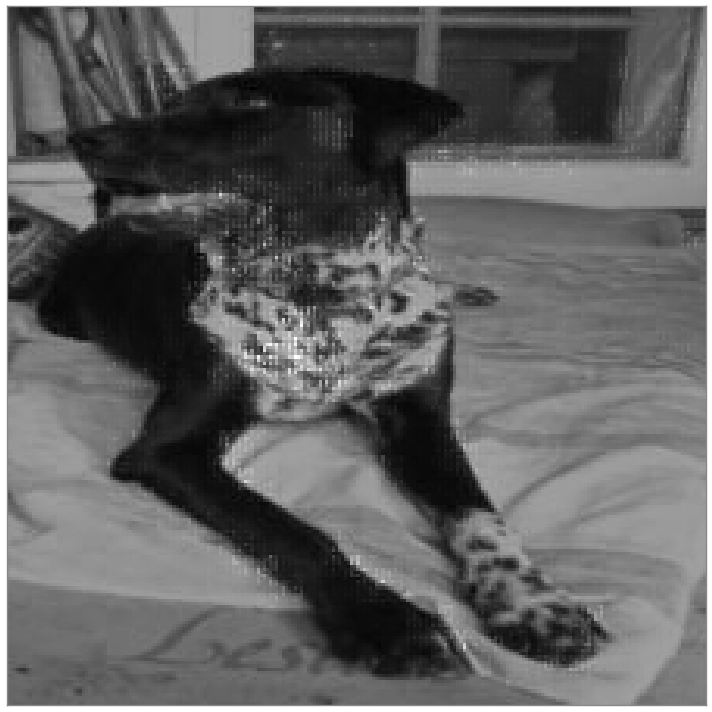

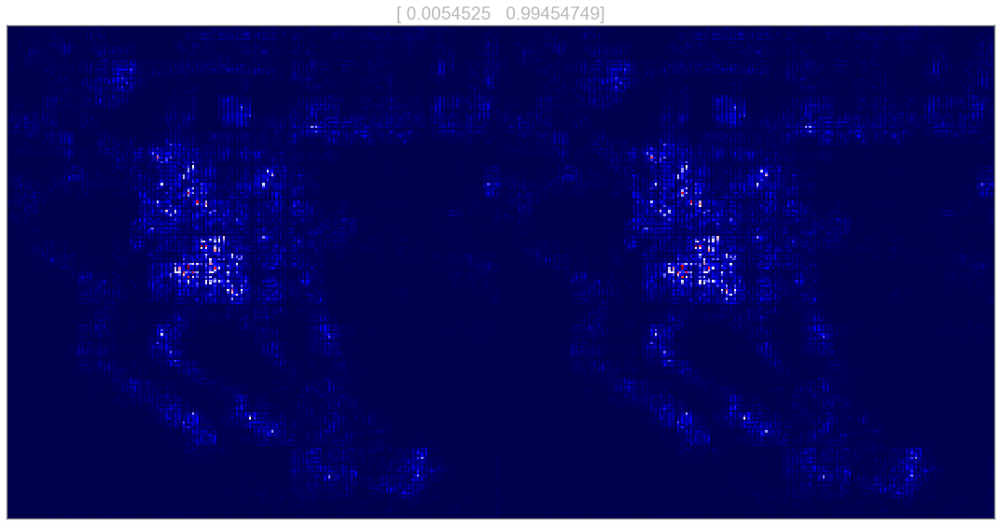

In [43]:
sample_img = data.next_batch(1, mode='valid')[0]
with tf.Session() as sess:
    restore_checkpoint(sess)
    d_cat, d_dog, label = sess.run([img_grad_cat, img_grad_dog, y_true], {x: sample_img, training:False})
    #d_cat = np.exp(d_cat)
    #d_dog = np.exp(d_dog)
    #np.clip(d_cat, d_cat.mean(), d_cat.max(), d_cat)
    #np.clip(d_dog, d_dog.mean(), d_dog.max(), d_dog)
    plot_images(np.mean(sample_img*0.5+0.5, 3) + d_cat/d_cat.max())
    plot_images(merge(np.vstack([d_cat, d_dog]), (1, 2)), label, cmap='seismic')

INFO:tensorflow:Restoring parameters from /home/vaisakh/TensorFlow-Tutorials/checkpoints/CatDog/CatDog


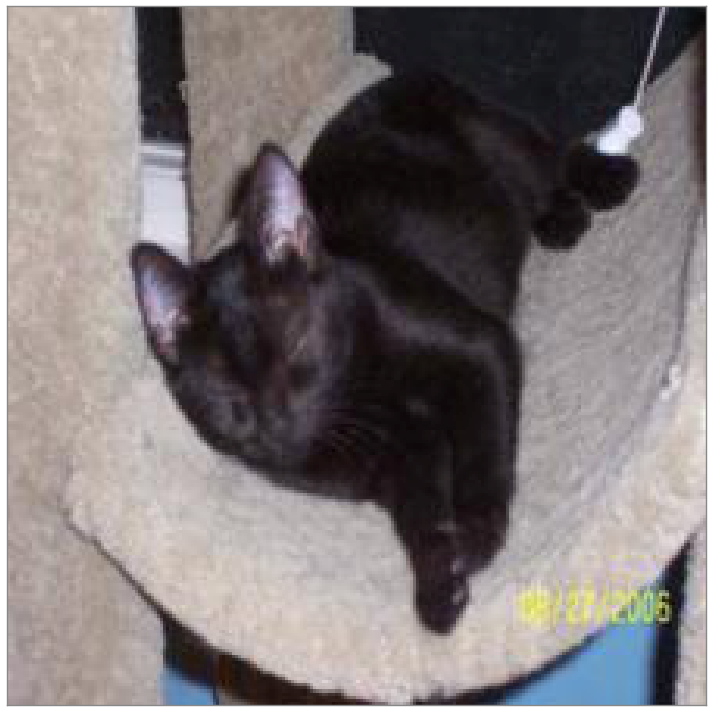

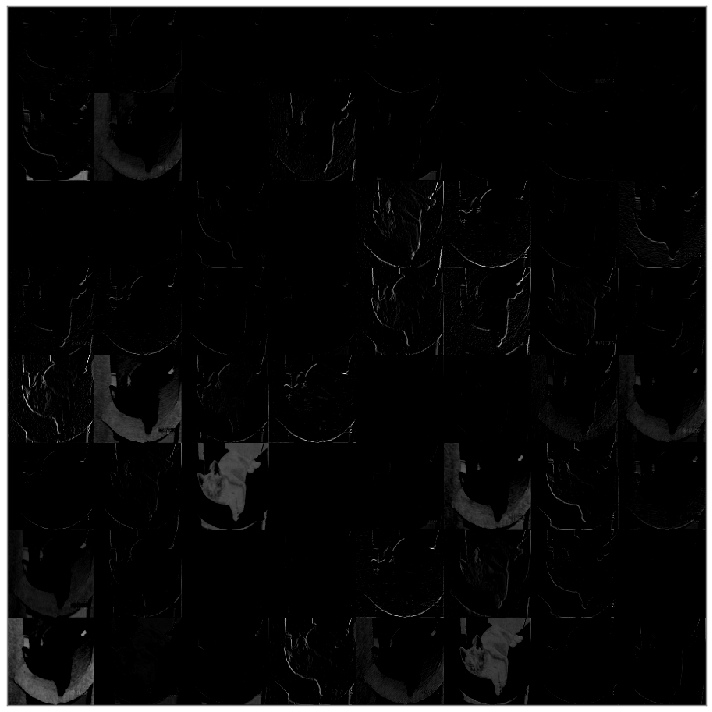

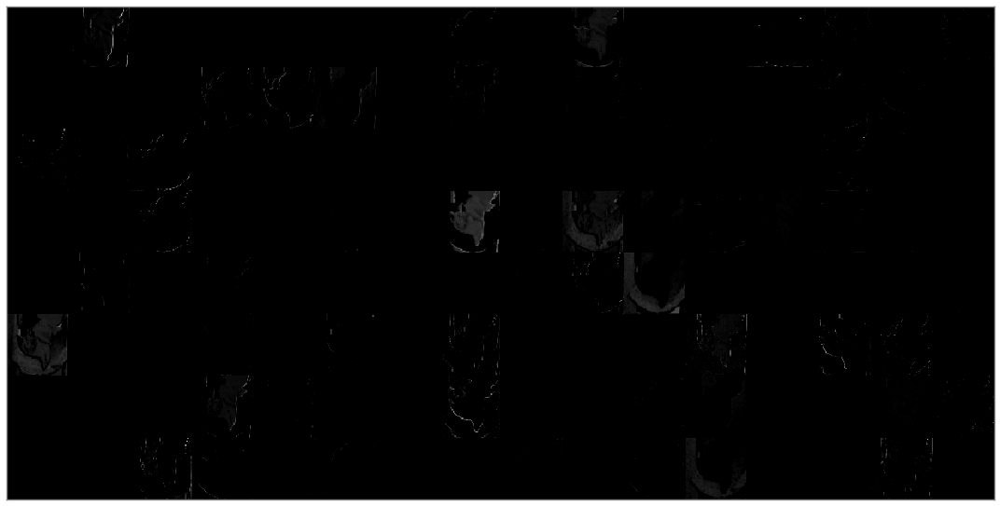

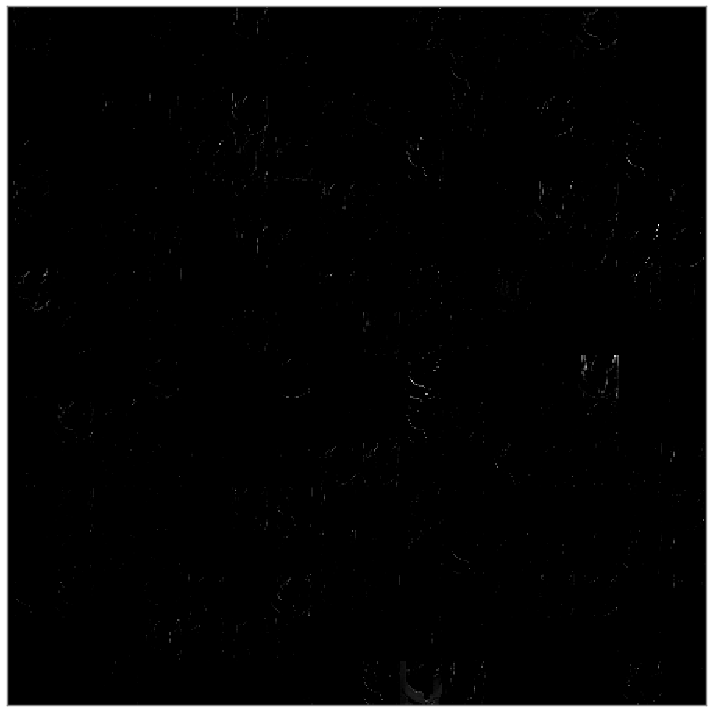

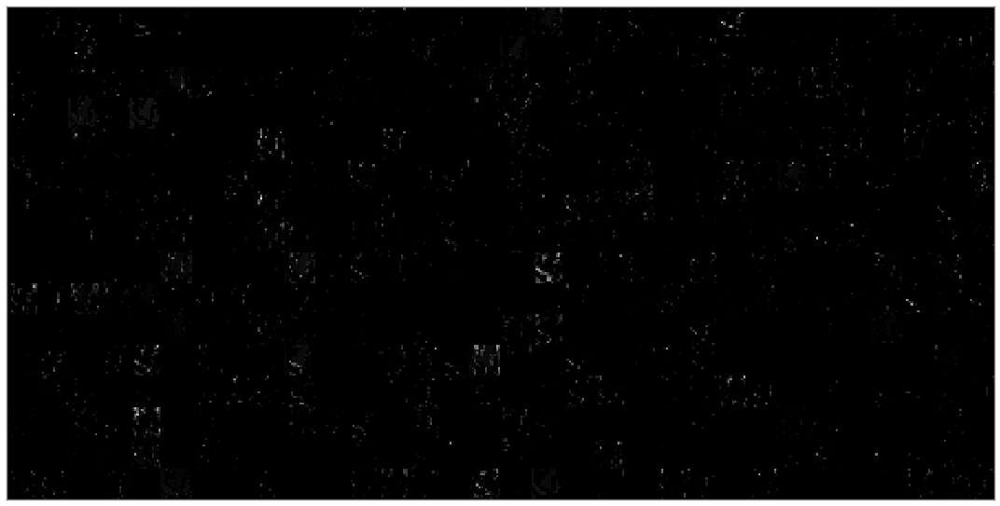

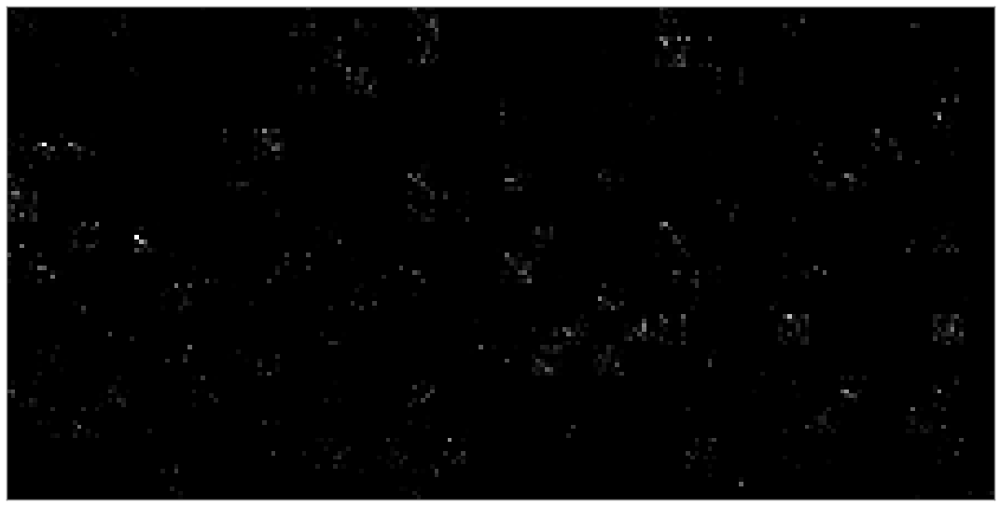

In [302]:
sample_img = data.next_batch(1, mode='valid')[0]
with tf.Session() as sess:
    restore_checkpoint(sess)
    conv_act = sess.run(conv_activations, {x: sample_img, training:False})

plot_images(sample_img*0.5+0.5)
for conv_act_layer in conv_act:
    plot_images(merge(np.swapaxes(conv_act_layer, 0, 3)))

INFO:tensorflow:Restoring parameters from /home/vaisakh/TensorFlow-Tutorials/checkpoints/CatDog/CatDog


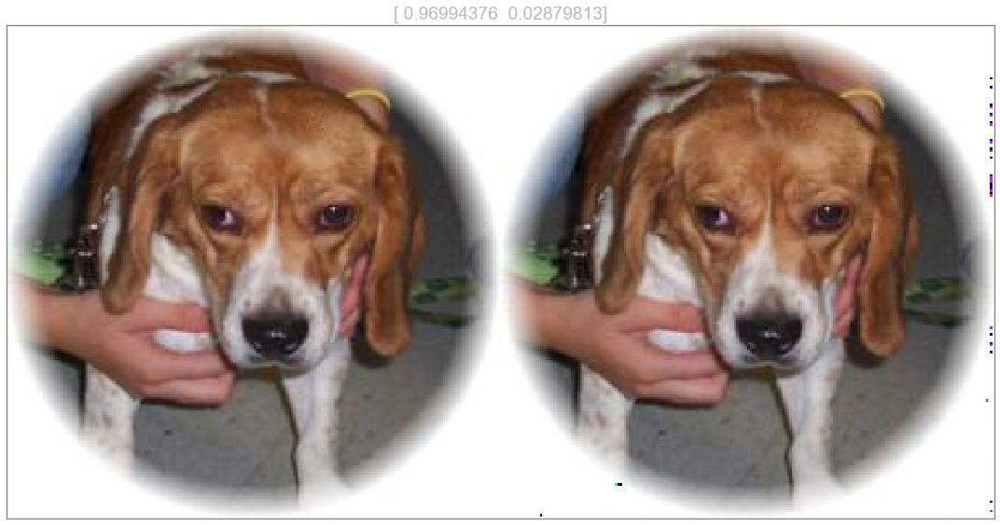

INFO:tensorflow:Restoring parameters from /home/vaisakh/TensorFlow-Tutorials/checkpoints/CatDog/CatDog


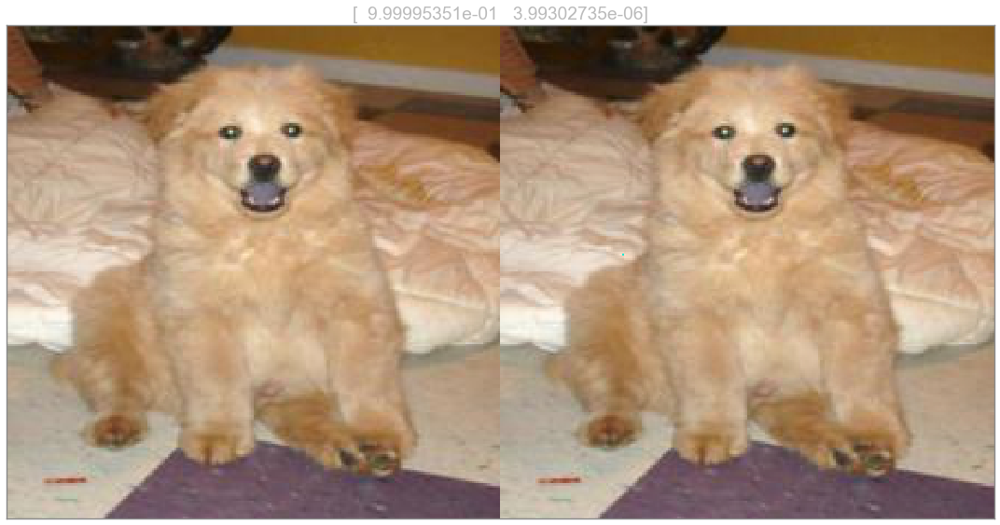

INFO:tensorflow:Restoring parameters from /home/vaisakh/TensorFlow-Tutorials/checkpoints/CatDog/CatDog


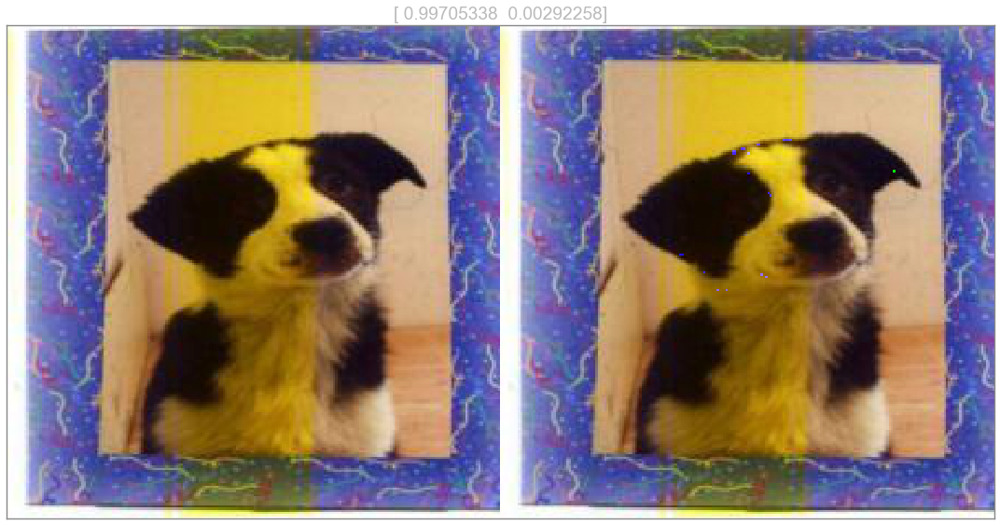

INFO:tensorflow:Restoring parameters from /home/vaisakh/TensorFlow-Tutorials/checkpoints/CatDog/CatDog


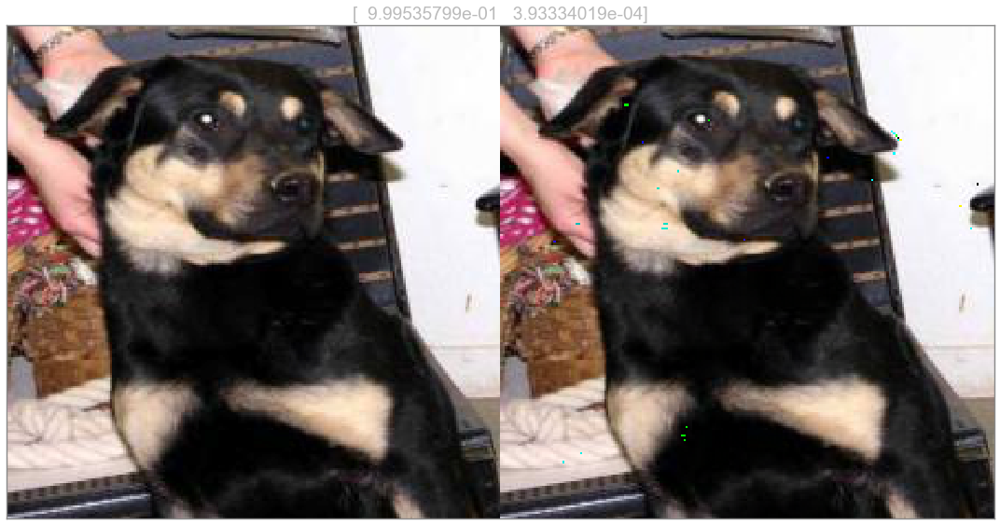

INFO:tensorflow:Restoring parameters from /home/vaisakh/TensorFlow-Tutorials/checkpoints/CatDog/CatDog


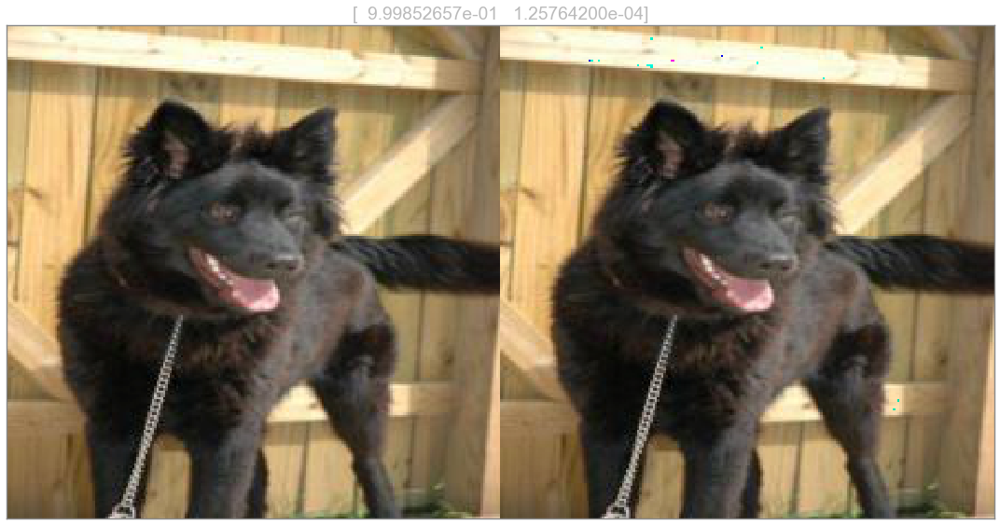

INFO:tensorflow:Restoring parameters from /home/vaisakh/TensorFlow-Tutorials/checkpoints/CatDog/CatDog


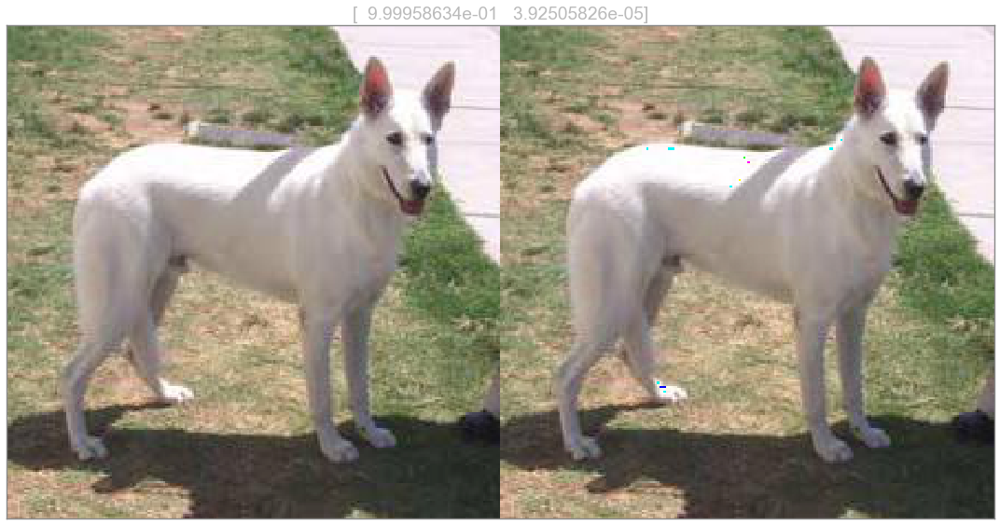

INFO:tensorflow:Restoring parameters from /home/vaisakh/TensorFlow-Tutorials/checkpoints/CatDog/CatDog


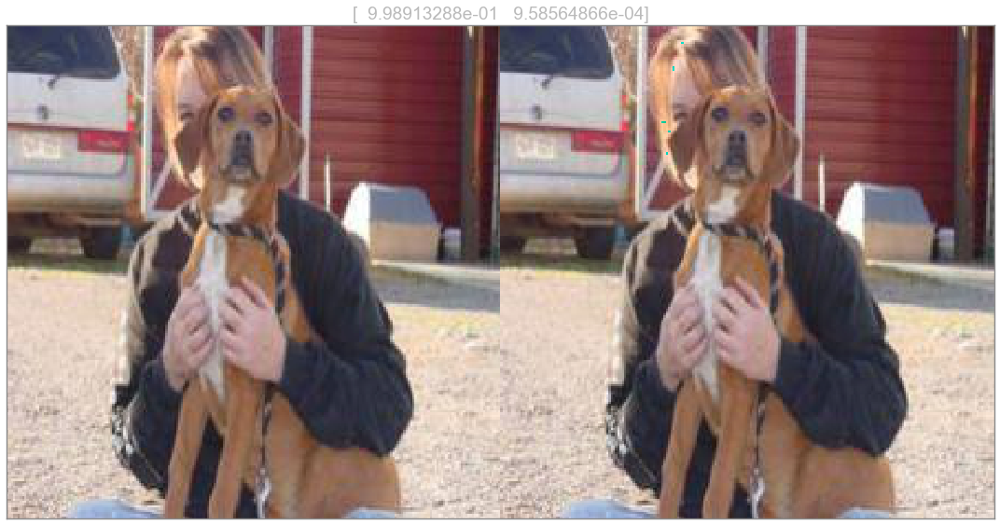

INFO:tensorflow:Restoring parameters from /home/vaisakh/TensorFlow-Tutorials/checkpoints/CatDog/CatDog


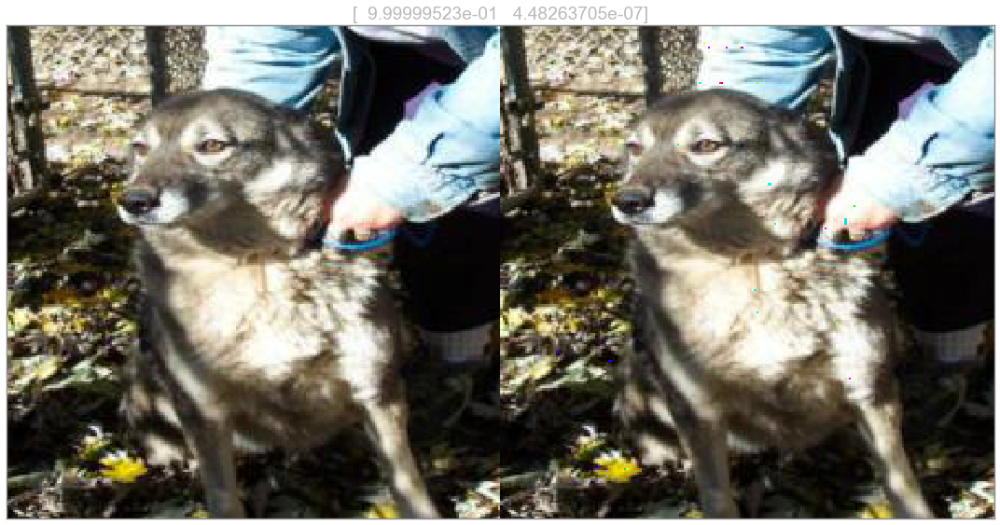

INFO:tensorflow:Restoring parameters from /home/vaisakh/TensorFlow-Tutorials/checkpoints/CatDog/CatDog


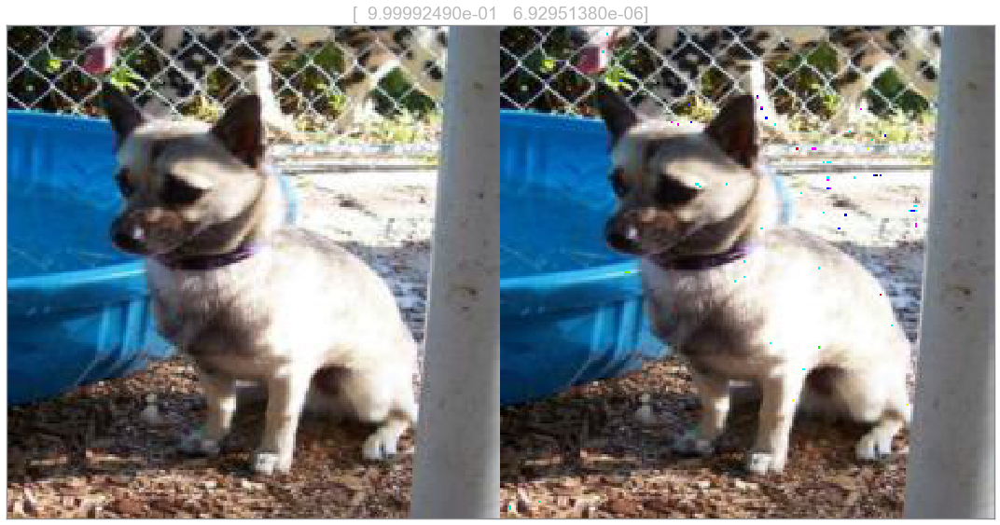

INFO:tensorflow:Restoring parameters from /home/vaisakh/TensorFlow-Tutorials/checkpoints/CatDog/CatDog


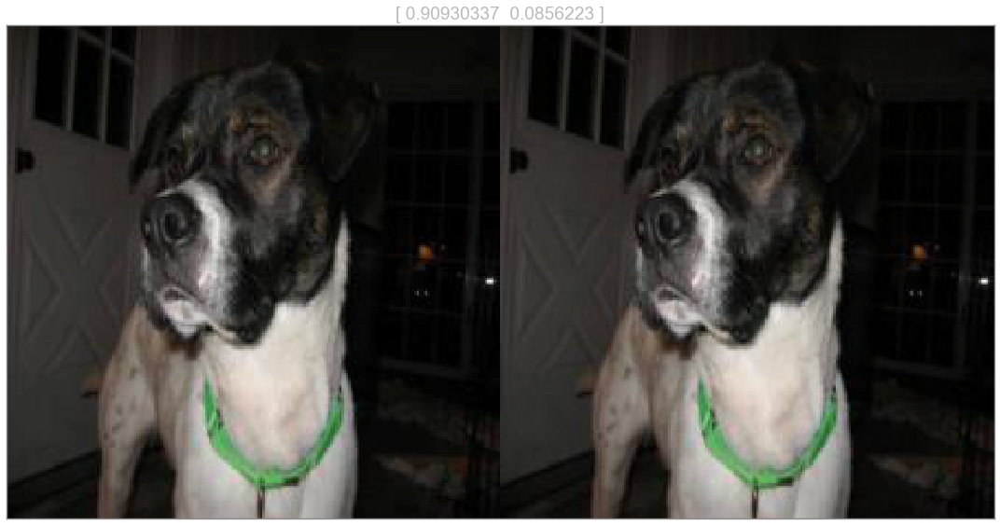

INFO:tensorflow:Restoring parameters from /home/vaisakh/TensorFlow-Tutorials/checkpoints/CatDog/CatDog


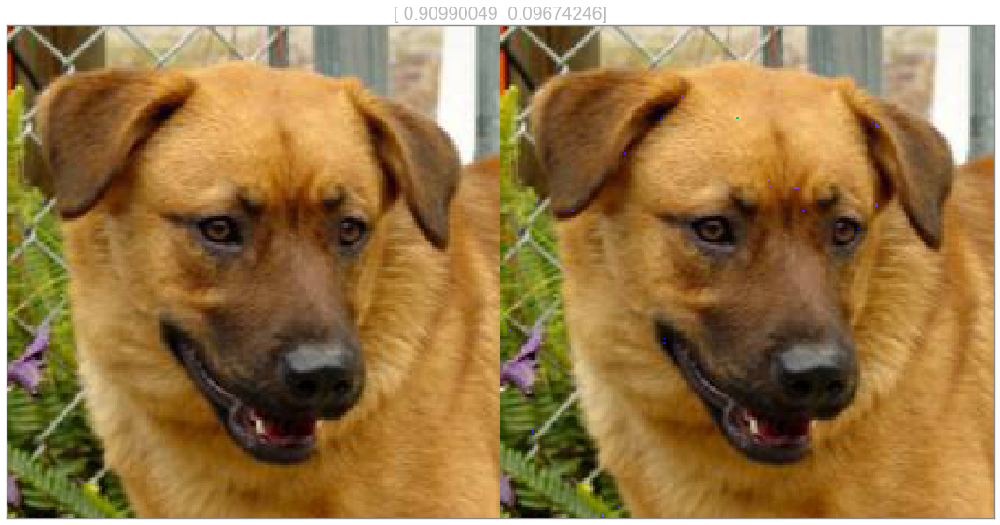

INFO:tensorflow:Restoring parameters from /home/vaisakh/TensorFlow-Tutorials/checkpoints/CatDog/CatDog


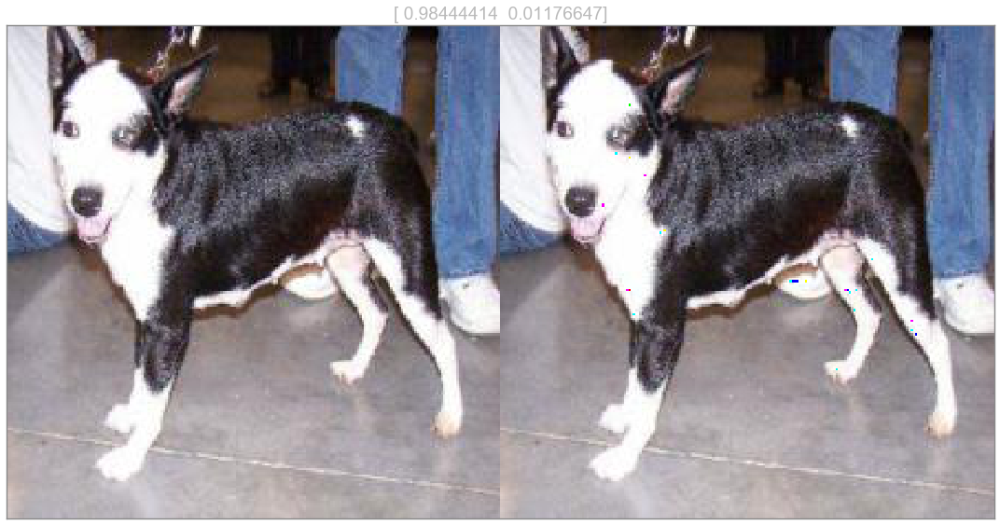

INFO:tensorflow:Restoring parameters from /home/vaisakh/TensorFlow-Tutorials/checkpoints/CatDog/CatDog


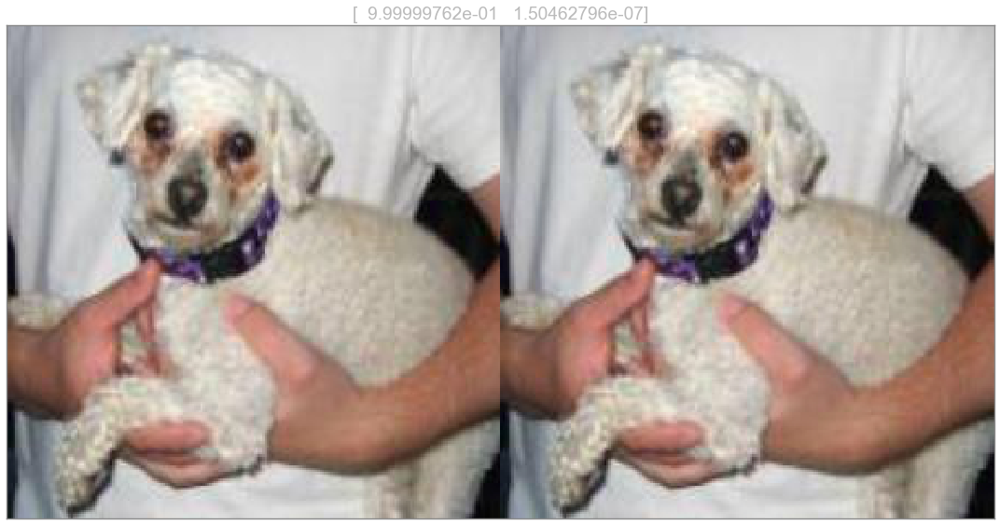

INFO:tensorflow:Restoring parameters from /home/vaisakh/TensorFlow-Tutorials/checkpoints/CatDog/CatDog


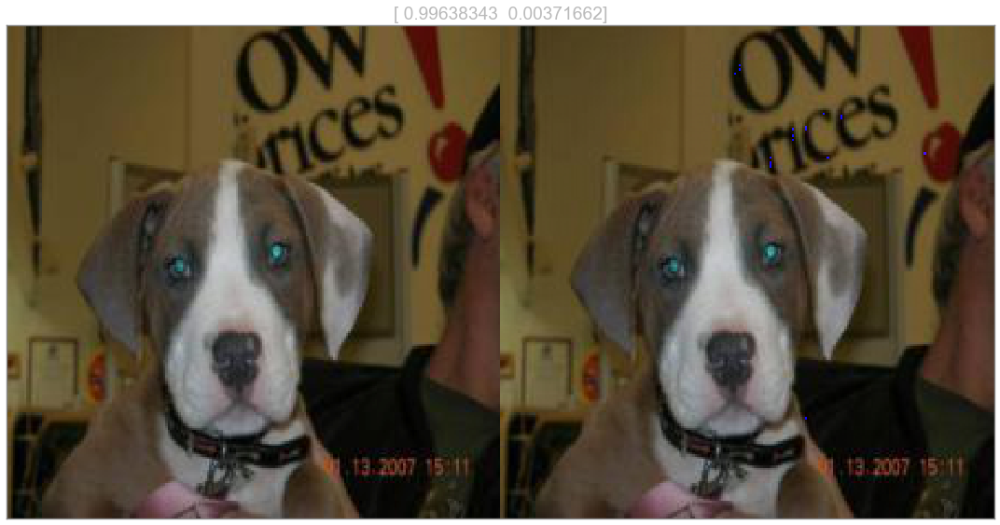

INFO:tensorflow:Restoring parameters from /home/vaisakh/TensorFlow-Tutorials/checkpoints/CatDog/CatDog


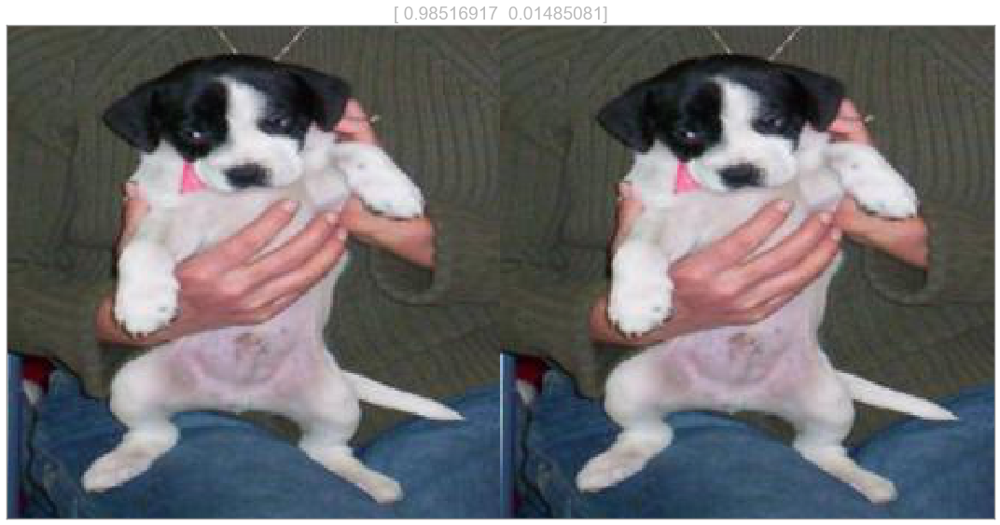

INFO:tensorflow:Restoring parameters from /home/vaisakh/TensorFlow-Tutorials/checkpoints/CatDog/CatDog


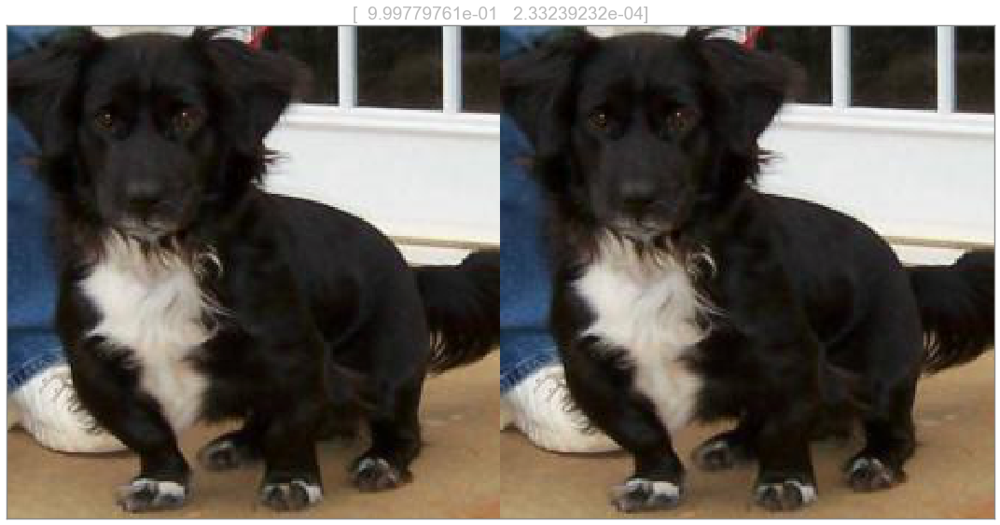

INFO:tensorflow:Restoring parameters from /home/vaisakh/TensorFlow-Tutorials/checkpoints/CatDog/CatDog


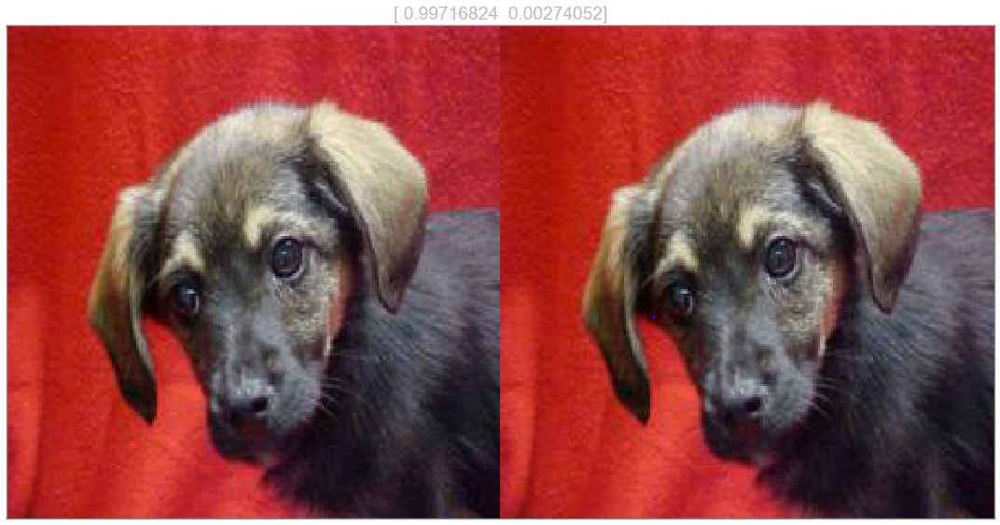

INFO:tensorflow:Restoring parameters from /home/vaisakh/TensorFlow-Tutorials/checkpoints/CatDog/CatDog


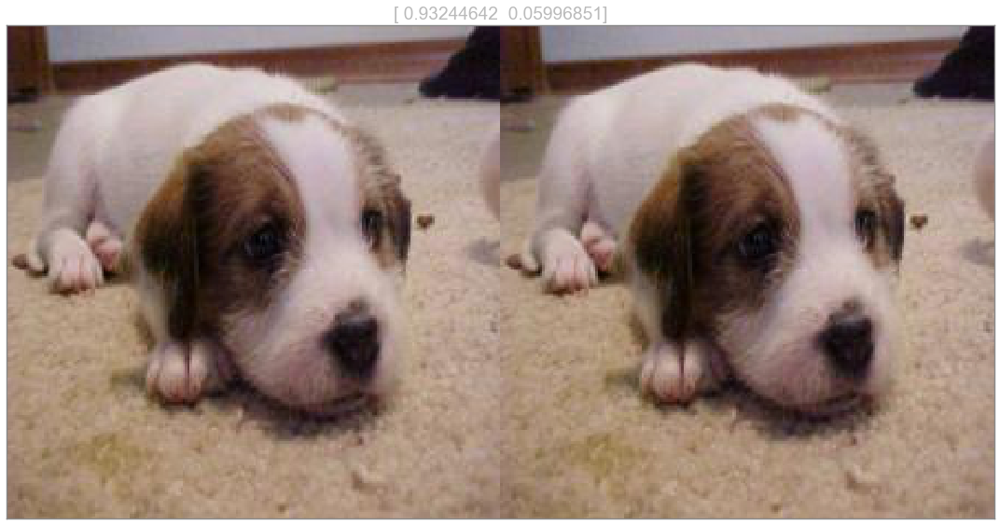

INFO:tensorflow:Restoring parameters from /home/vaisakh/TensorFlow-Tutorials/checkpoints/CatDog/CatDog


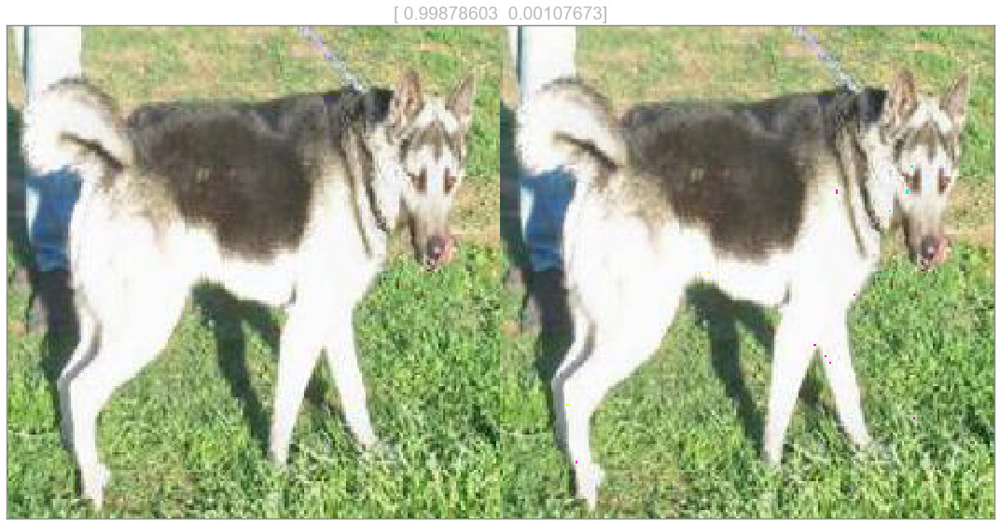

INFO:tensorflow:Restoring parameters from /home/vaisakh/TensorFlow-Tutorials/checkpoints/CatDog/CatDog


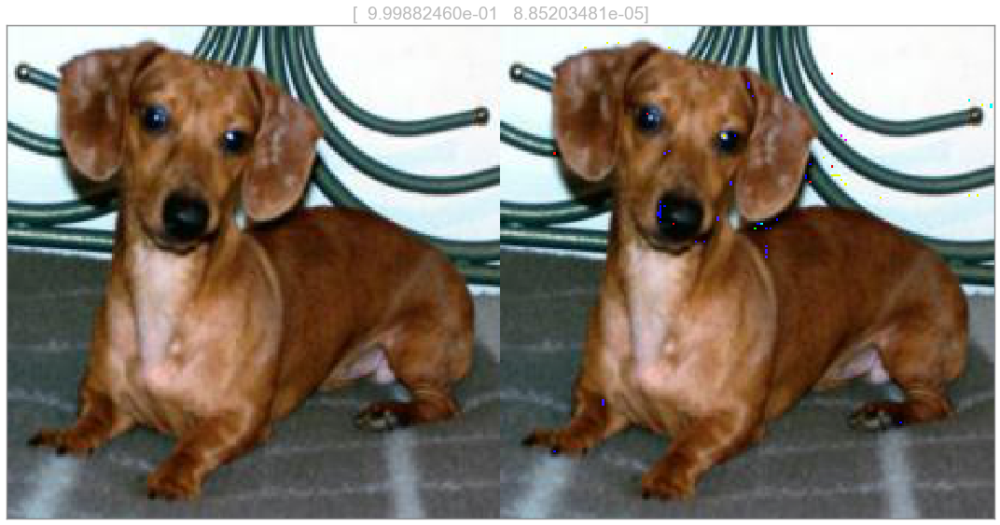

INFO:tensorflow:Restoring parameters from /home/vaisakh/TensorFlow-Tutorials/checkpoints/CatDog/CatDog


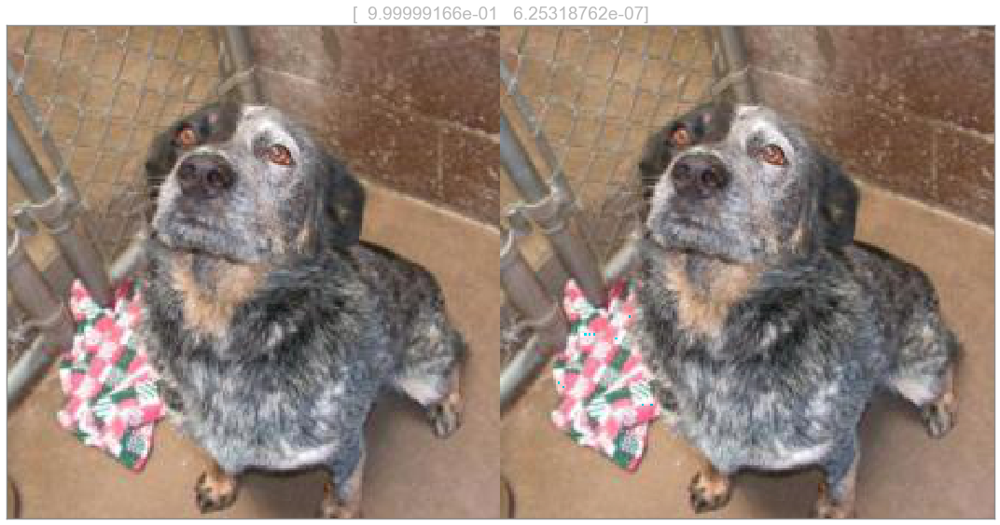

INFO:tensorflow:Restoring parameters from /home/vaisakh/TensorFlow-Tutorials/checkpoints/CatDog/CatDog


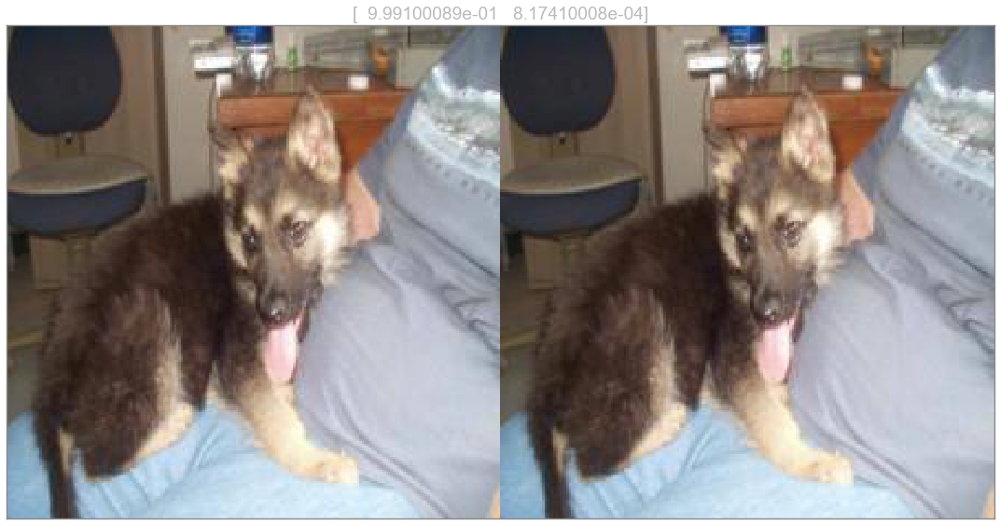

INFO:tensorflow:Restoring parameters from /home/vaisakh/TensorFlow-Tutorials/checkpoints/CatDog/CatDog


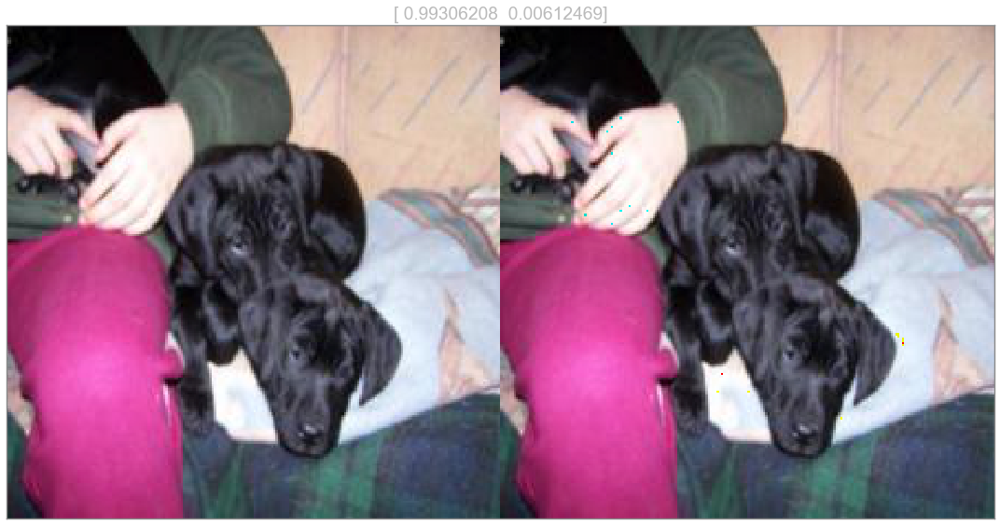

INFO:tensorflow:Restoring parameters from /home/vaisakh/TensorFlow-Tutorials/checkpoints/CatDog/CatDog


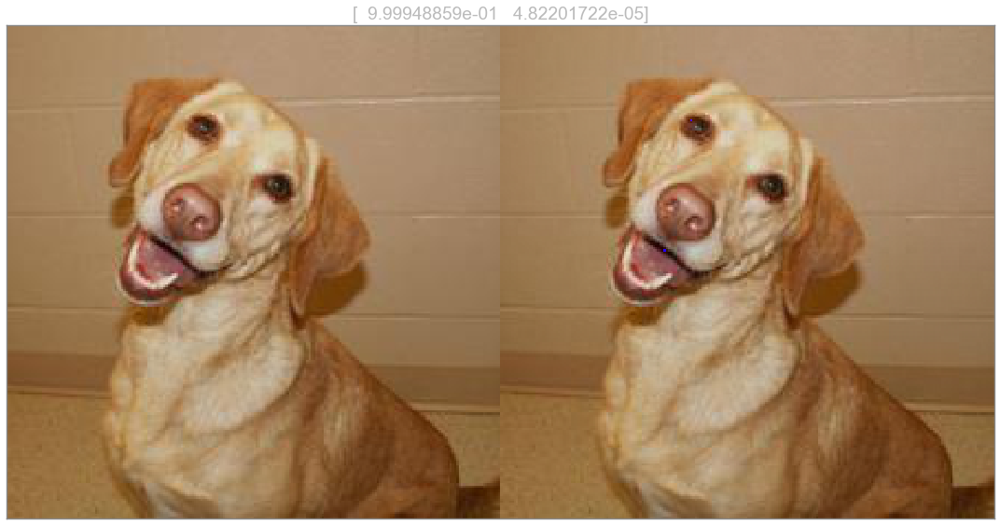

INFO:tensorflow:Restoring parameters from /home/vaisakh/TensorFlow-Tutorials/checkpoints/CatDog/CatDog


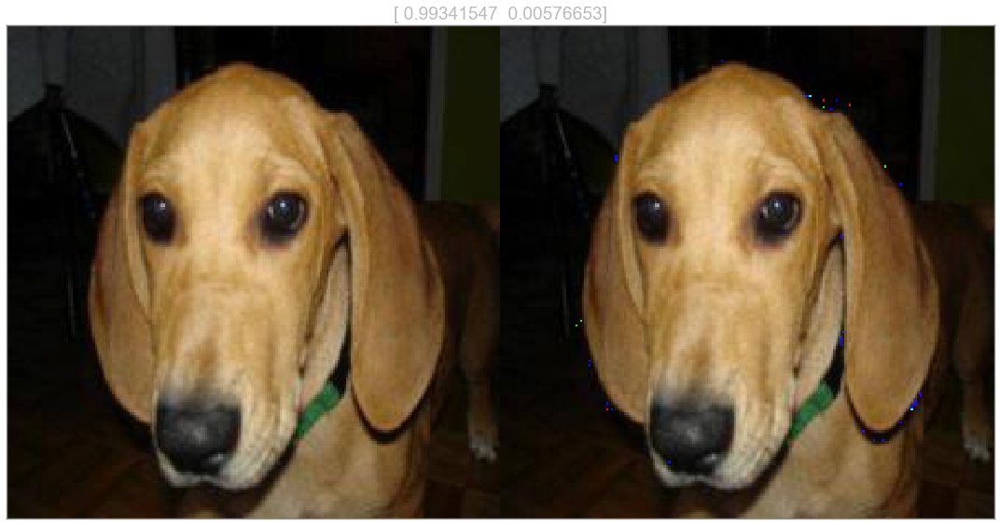

INFO:tensorflow:Restoring parameters from /home/vaisakh/TensorFlow-Tutorials/checkpoints/CatDog/CatDog


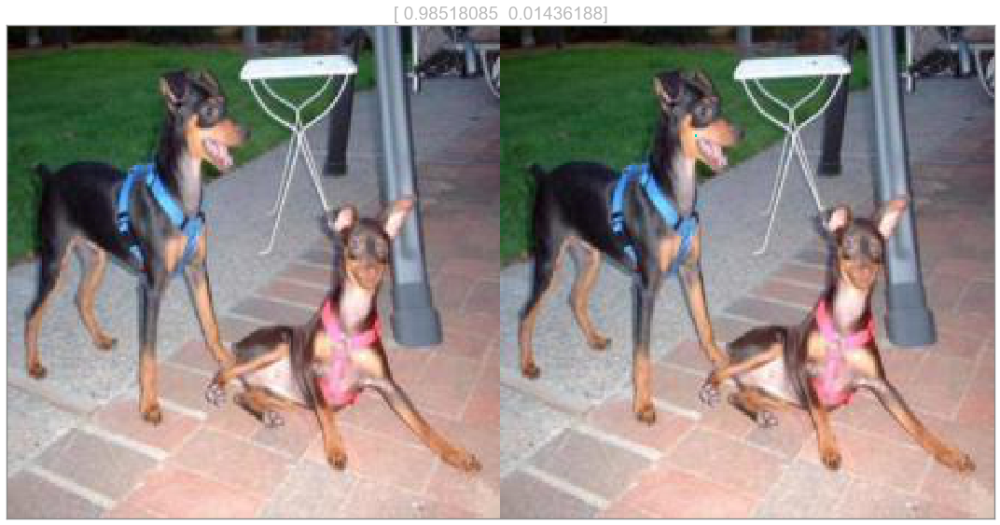

INFO:tensorflow:Restoring parameters from /home/vaisakh/TensorFlow-Tutorials/checkpoints/CatDog/CatDog


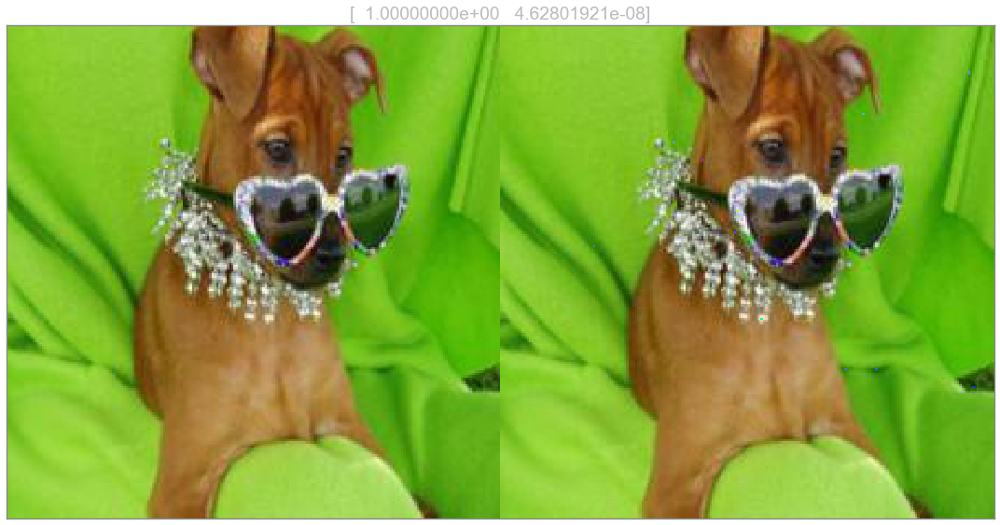

INFO:tensorflow:Restoring parameters from /home/vaisakh/TensorFlow-Tutorials/checkpoints/CatDog/CatDog


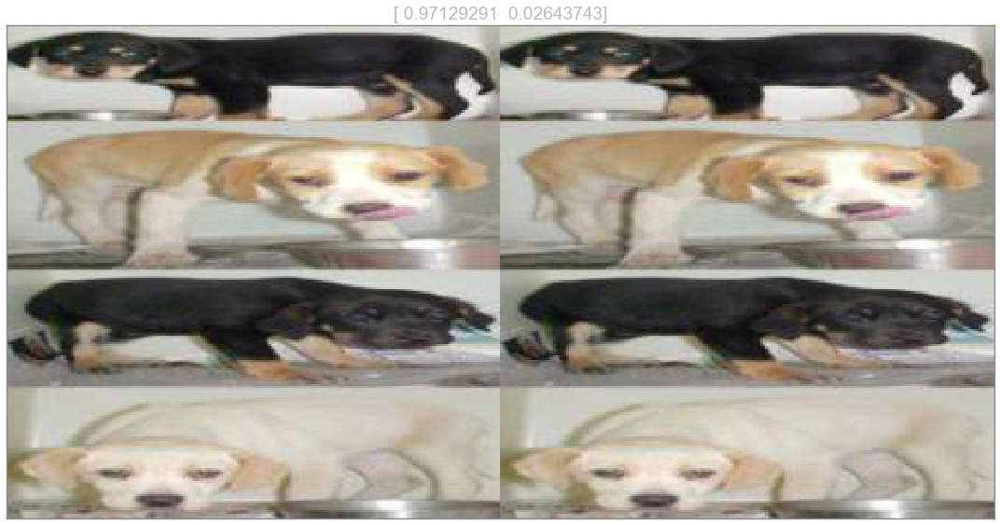

INFO:tensorflow:Restoring parameters from /home/vaisakh/TensorFlow-Tutorials/checkpoints/CatDog/CatDog


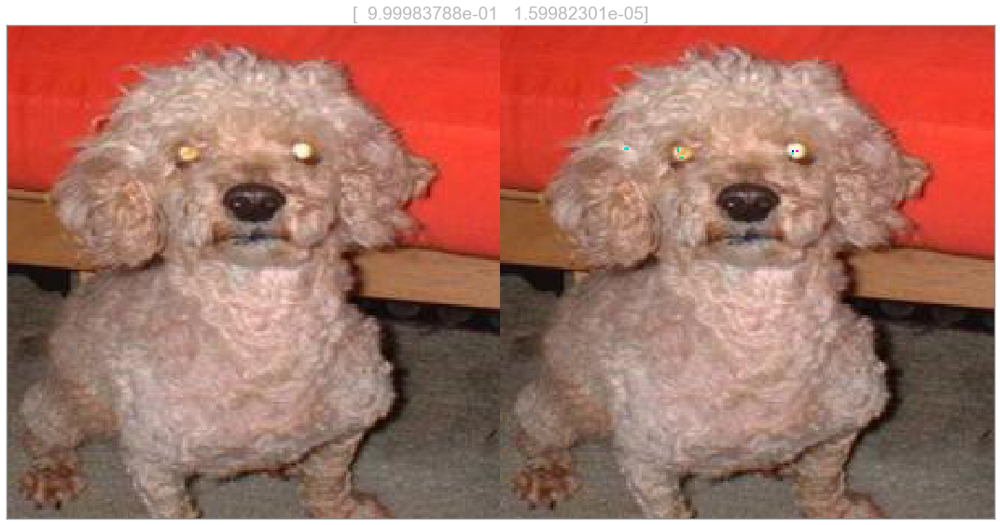

INFO:tensorflow:Restoring parameters from /home/vaisakh/TensorFlow-Tutorials/checkpoints/CatDog/CatDog


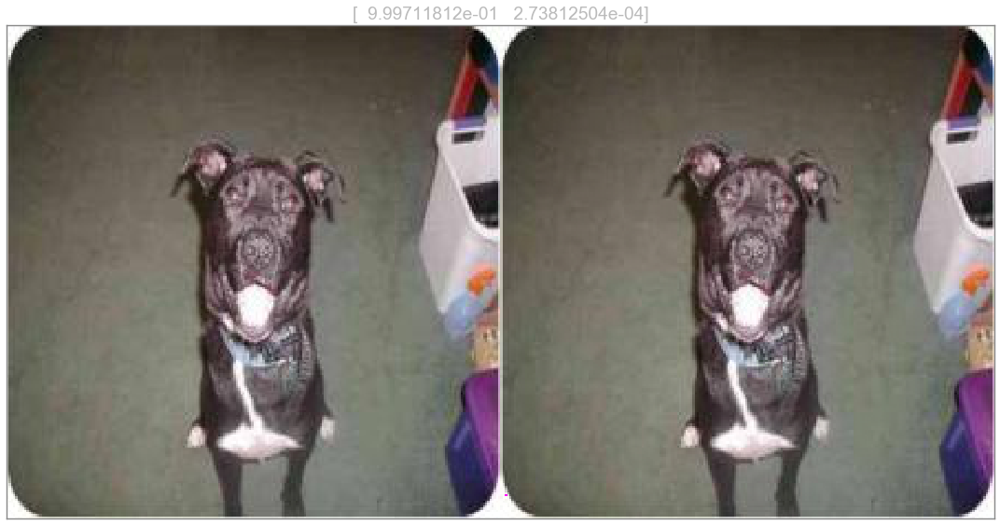

INFO:tensorflow:Restoring parameters from /home/vaisakh/TensorFlow-Tutorials/checkpoints/CatDog/CatDog


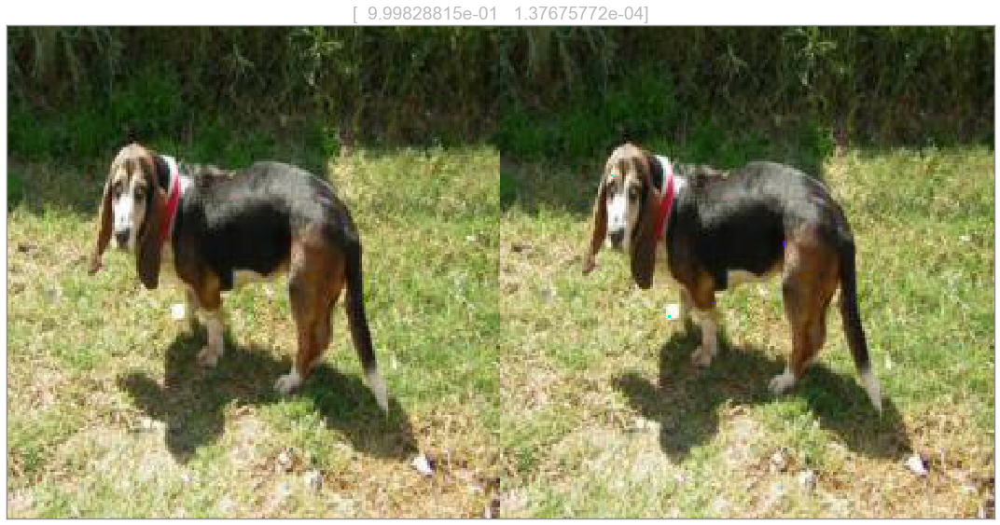

INFO:tensorflow:Restoring parameters from /home/vaisakh/TensorFlow-Tutorials/checkpoints/CatDog/CatDog


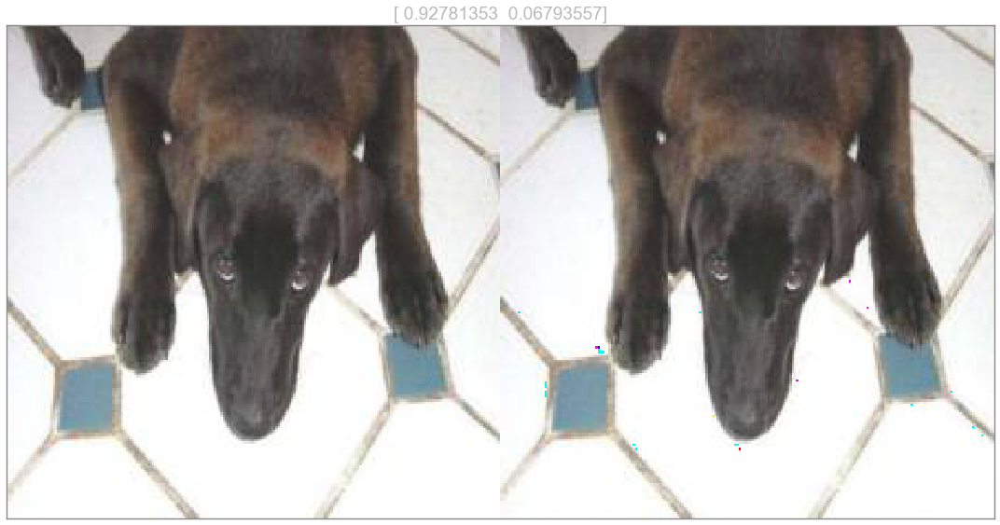

INFO:tensorflow:Restoring parameters from /home/vaisakh/TensorFlow-Tutorials/checkpoints/CatDog/CatDog


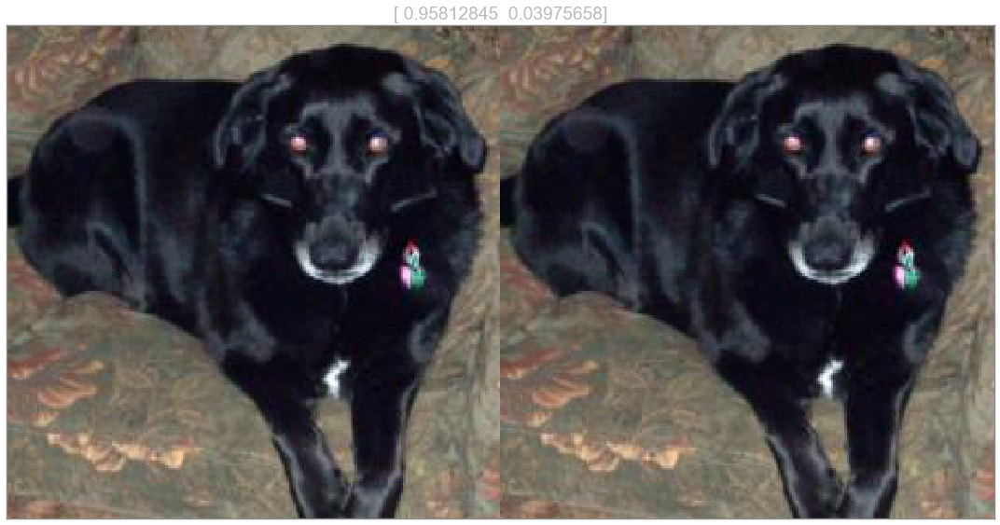

INFO:tensorflow:Restoring parameters from /home/vaisakh/TensorFlow-Tutorials/checkpoints/CatDog/CatDog


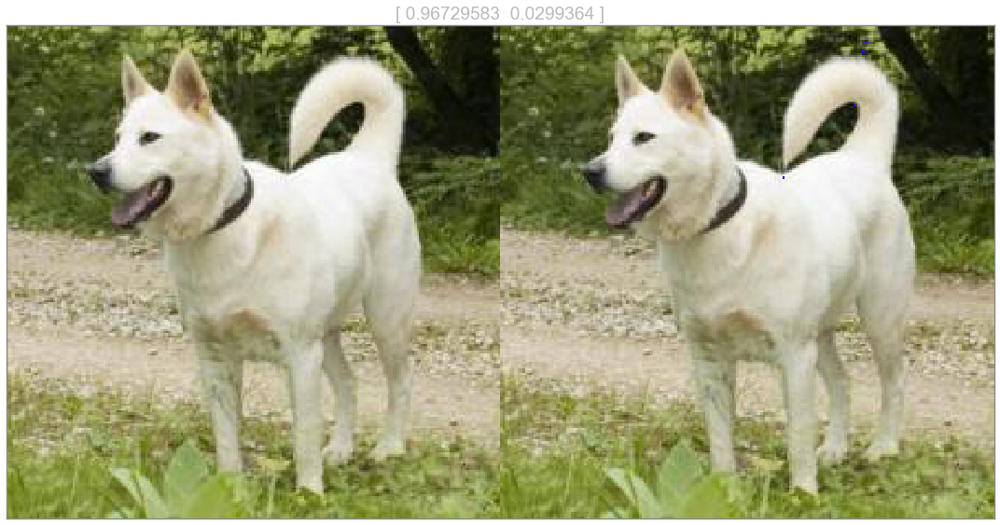

INFO:tensorflow:Restoring parameters from /home/vaisakh/TensorFlow-Tutorials/checkpoints/CatDog/CatDog


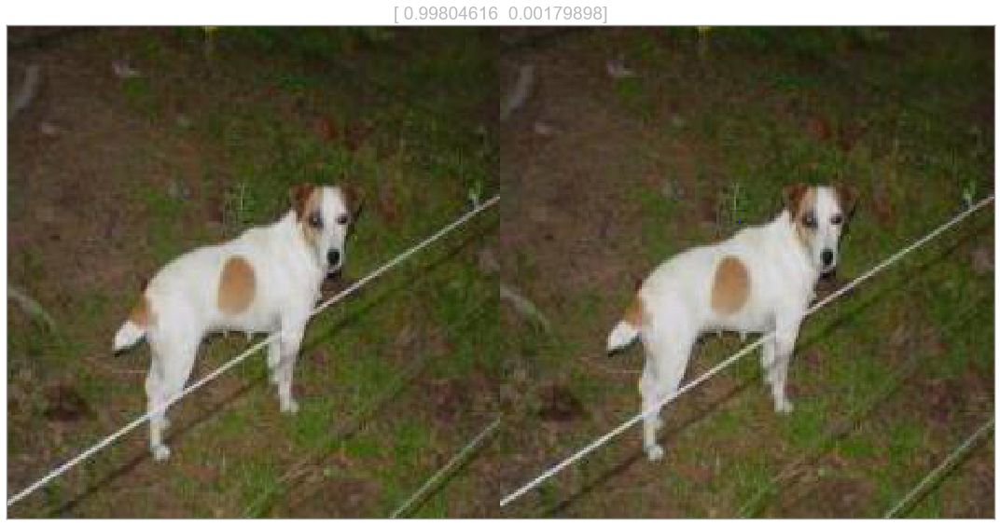

INFO:tensorflow:Restoring parameters from /home/vaisakh/TensorFlow-Tutorials/checkpoints/CatDog/CatDog


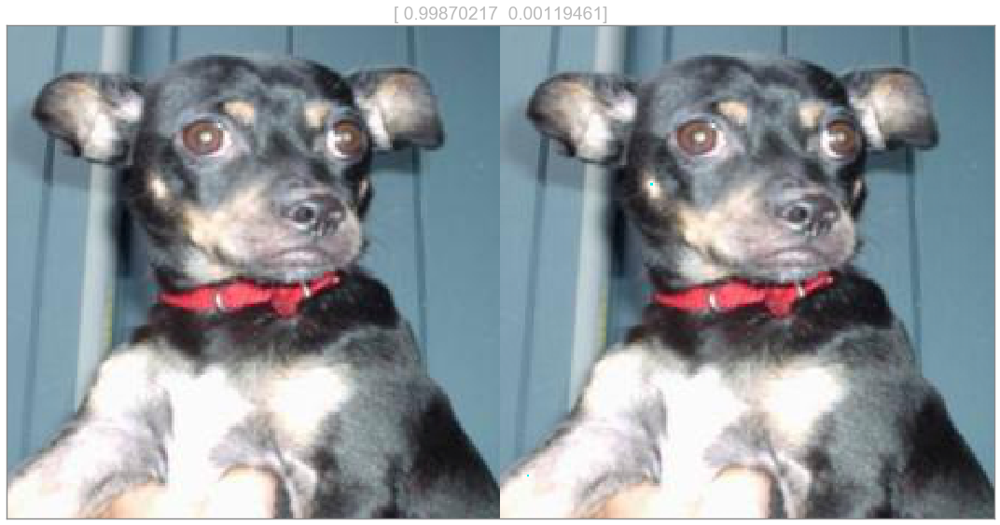

INFO:tensorflow:Restoring parameters from /home/vaisakh/TensorFlow-Tutorials/checkpoints/CatDog/CatDog


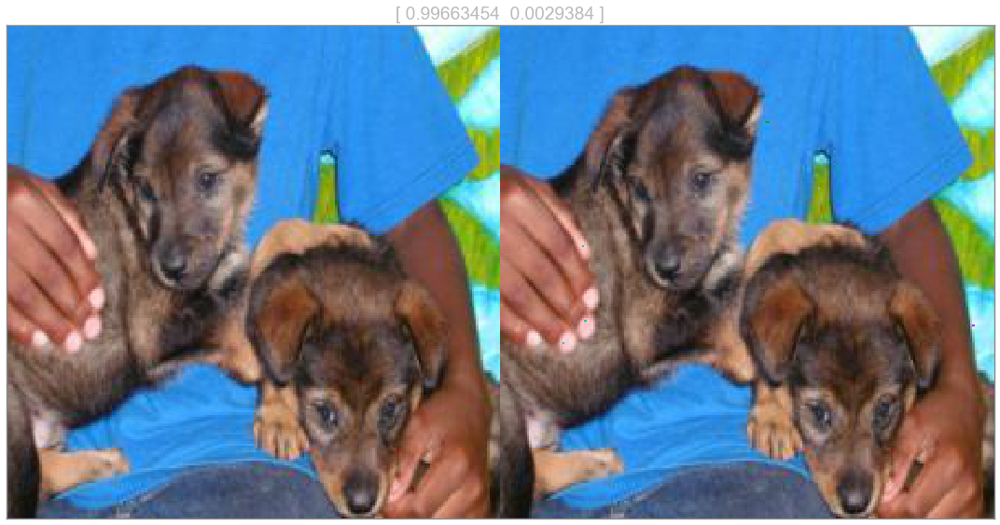

INFO:tensorflow:Restoring parameters from /home/vaisakh/TensorFlow-Tutorials/checkpoints/CatDog/CatDog


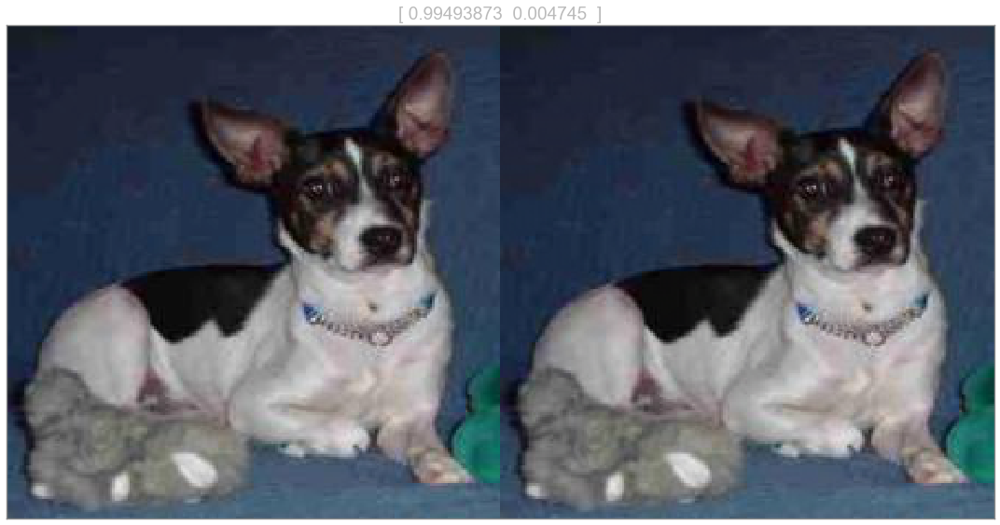

INFO:tensorflow:Restoring parameters from /home/vaisakh/TensorFlow-Tutorials/checkpoints/CatDog/CatDog


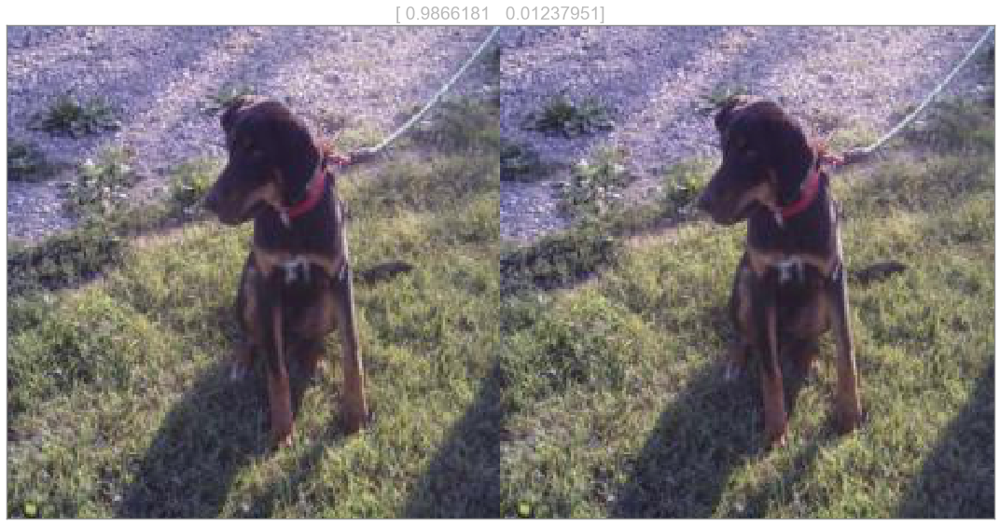

INFO:tensorflow:Restoring parameters from /home/vaisakh/TensorFlow-Tutorials/checkpoints/CatDog/CatDog


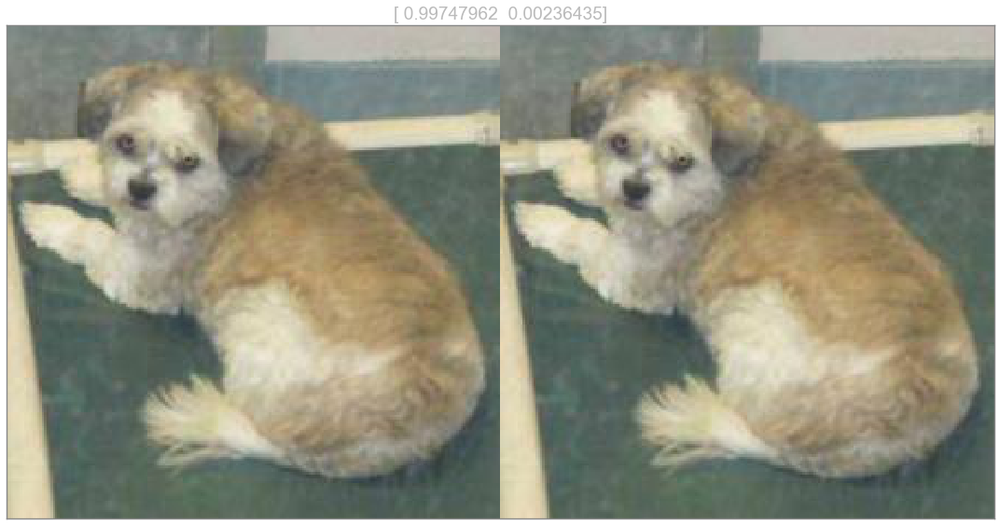

INFO:tensorflow:Restoring parameters from /home/vaisakh/TensorFlow-Tutorials/checkpoints/CatDog/CatDog


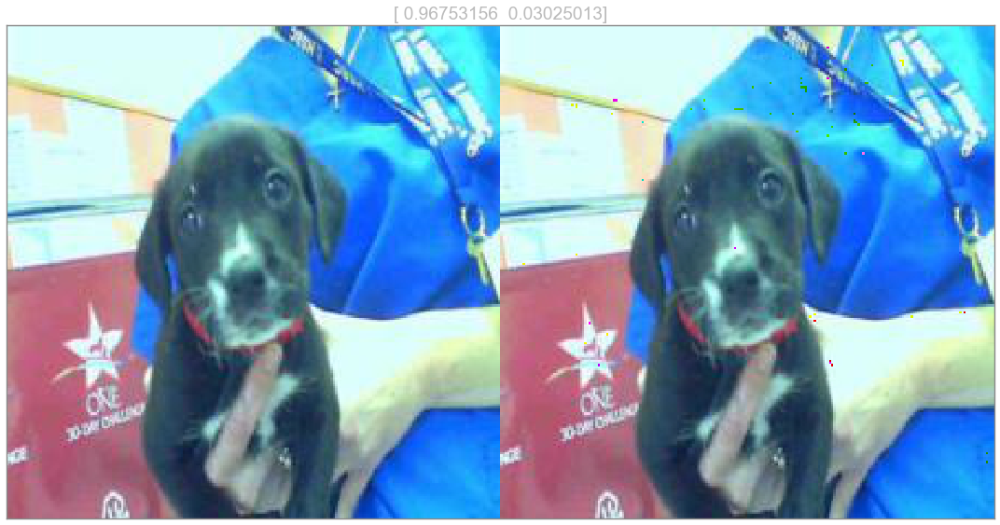

INFO:tensorflow:Restoring parameters from /home/vaisakh/TensorFlow-Tutorials/checkpoints/CatDog/CatDog


IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


INFO:tensorflow:Restoring parameters from /home/vaisakh/TensorFlow-Tutorials/checkpoints/CatDog/CatDog


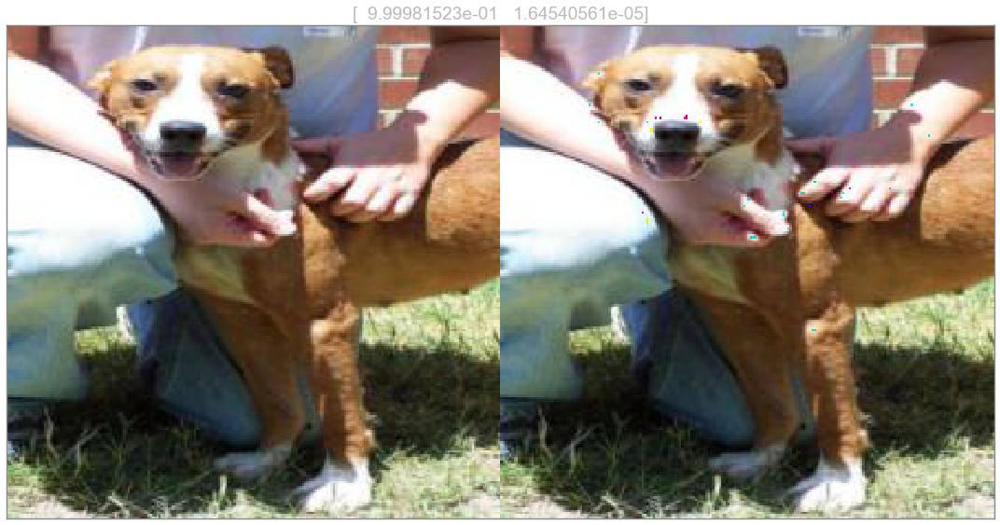

INFO:tensorflow:Restoring parameters from /home/vaisakh/TensorFlow-Tutorials/checkpoints/CatDog/CatDog


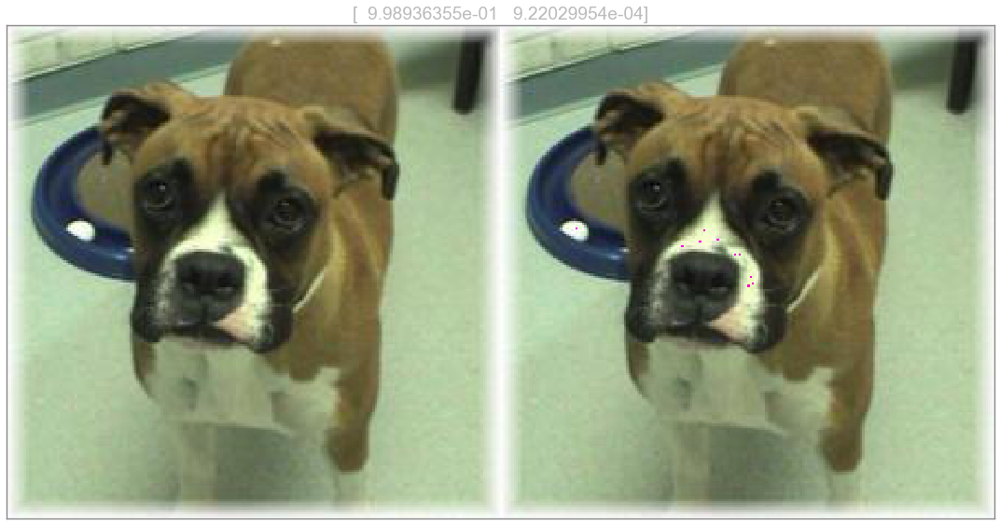

INFO:tensorflow:Restoring parameters from /home/vaisakh/TensorFlow-Tutorials/checkpoints/CatDog/CatDog


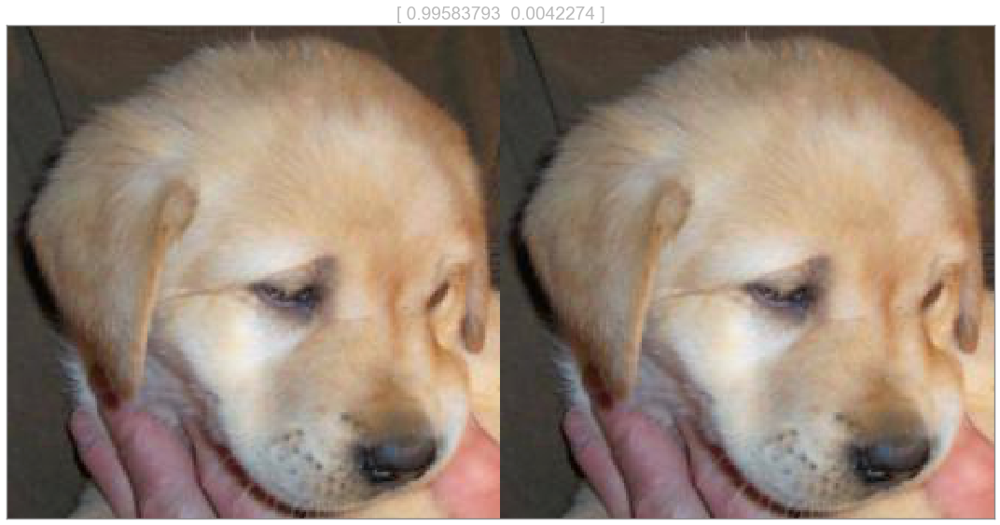

INFO:tensorflow:Restoring parameters from /home/vaisakh/TensorFlow-Tutorials/checkpoints/CatDog/CatDog


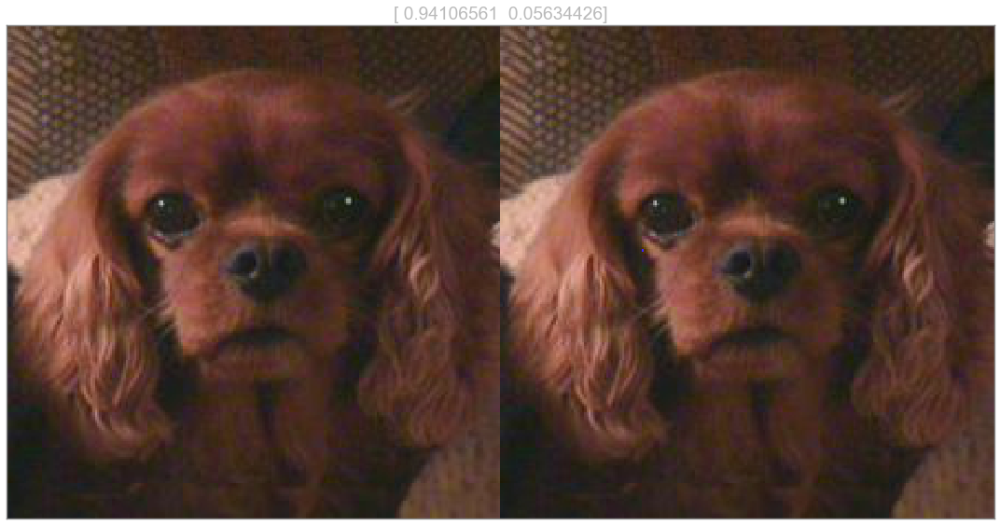

INFO:tensorflow:Restoring parameters from /home/vaisakh/TensorFlow-Tutorials/checkpoints/CatDog/CatDog


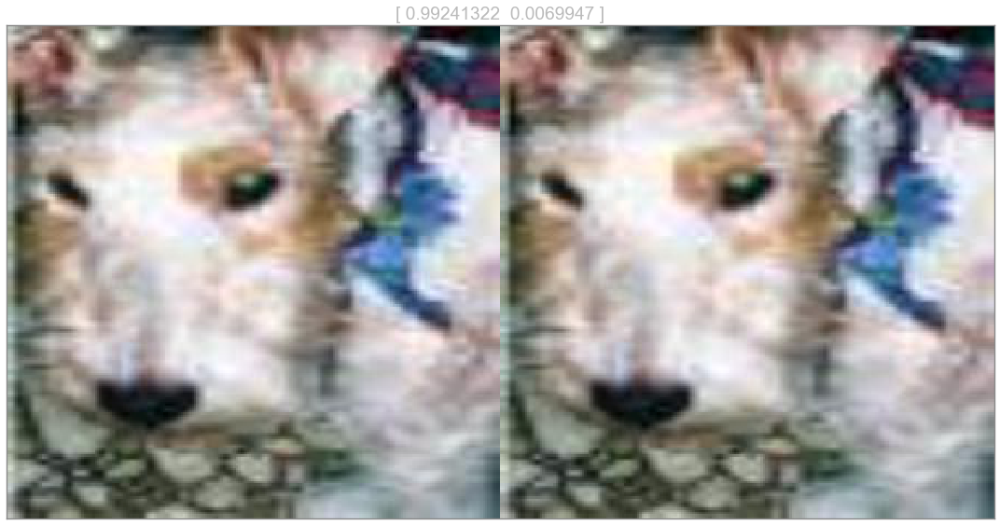

INFO:tensorflow:Restoring parameters from /home/vaisakh/TensorFlow-Tutorials/checkpoints/CatDog/CatDog


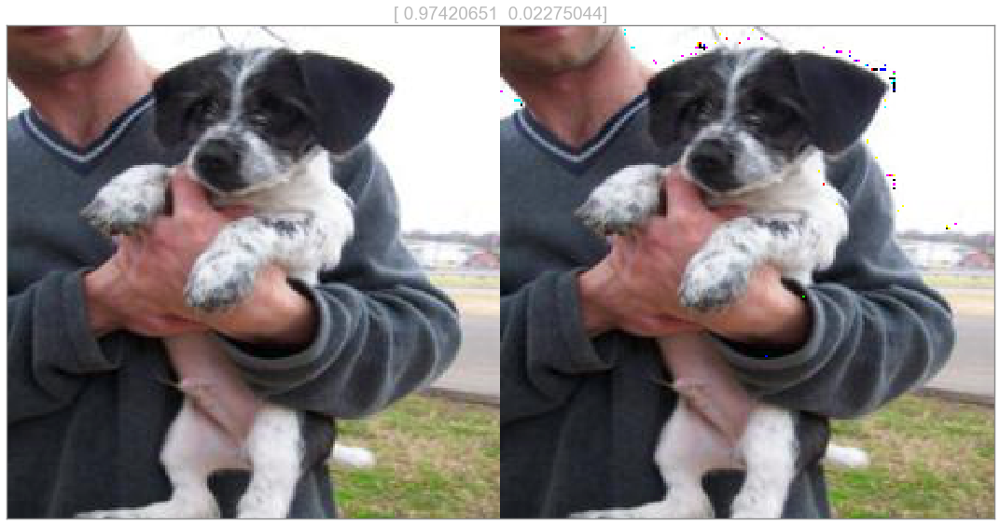

INFO:tensorflow:Restoring parameters from /home/vaisakh/TensorFlow-Tutorials/checkpoints/CatDog/CatDog


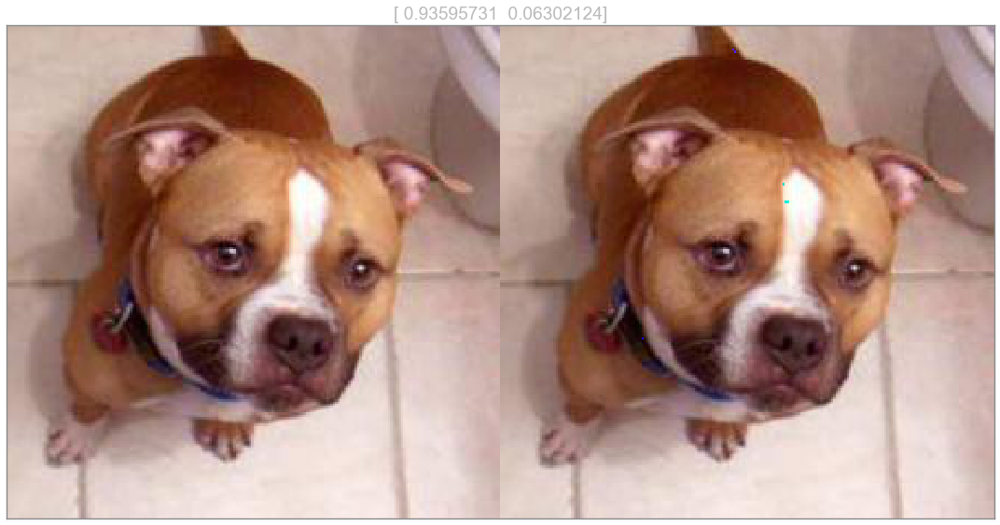

INFO:tensorflow:Restoring parameters from /home/vaisakh/TensorFlow-Tutorials/checkpoints/CatDog/CatDog


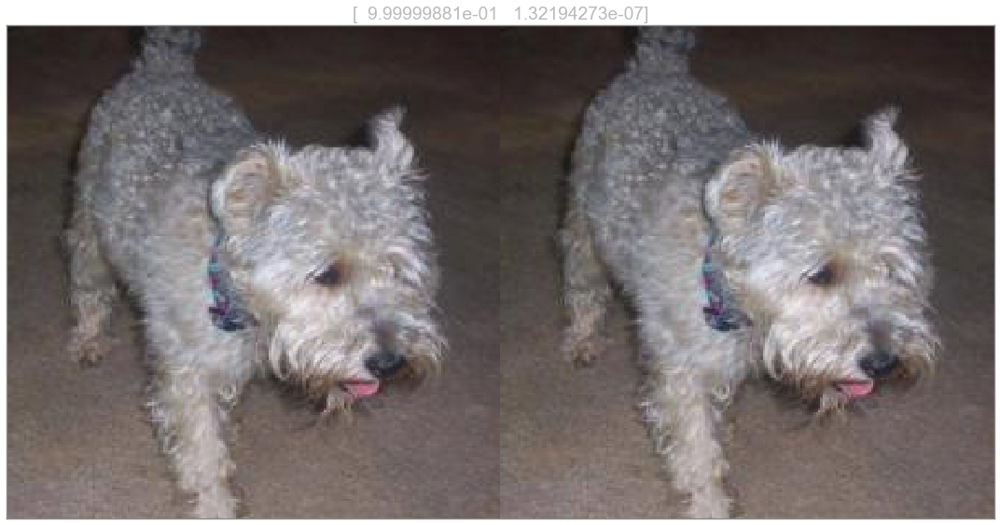

In [63]:
for _ in range(100):
    sample_img_original, original_label = data.next_batch(1, mode='valid')
    sample_img = np.copy(sample_img_original)
    if original_label.argmax() == 1:
        with tf.Session() as sess:
            restore_checkpoint(sess)
            for _ in range(10):
                d_cat, label = sess.run([img_grad_cat[0], y_true], {x: sample_img})
                if label[0, 0] > 0.9:
                    break
                sample_img += 1e-1*d_cat
            plot_images(merge(np.vstack([sample_img_original, sample_img])*0.5+0.5, (1, 2)), label)

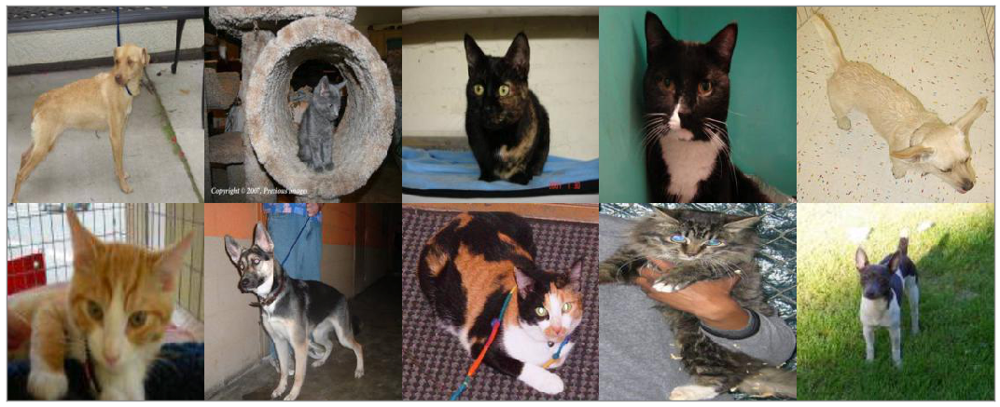

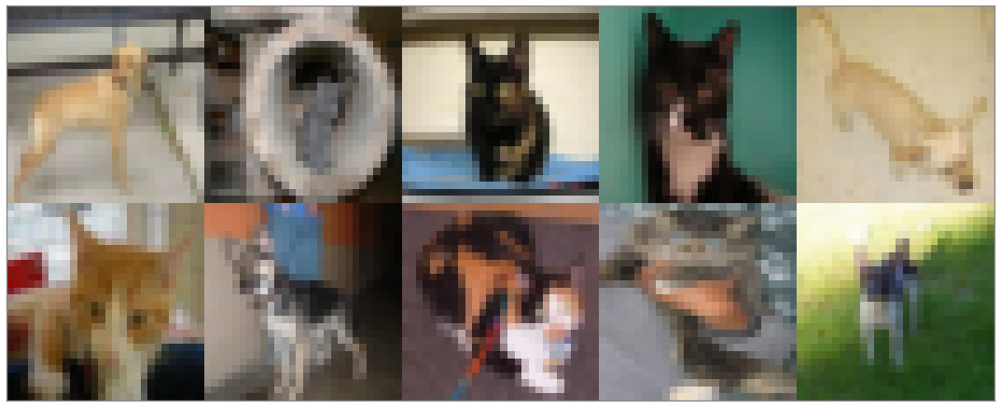

In [345]:
from scipy.misc import imresize
def batch_resize(batch_img):
    resized_img = np.zeros((batch_img.shape[0], 28, 28, 3))
    for i, image in enumerate(batch_img):
        resized_img[i] = imresize(image, (28,28))
    
    return resized_img

sample_img = data.next_batch(10)[0]
plot_images(merge(sample_img*0.5+0.5))
plot_images(merge(batch_resize((sample_img+1)*127.5)/255))